<a href="https://colab.research.google.com/github/bernatm/ABDataChallengeExtension/blob/main/ConsumPerZona.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Import libraries#

In [ ]:
import pandas as pd
from collections import Counter
import seaborn as sns
import numpy as np
from matplotlib import pyplot
import matplotlib.pyplot as plt
import scipy.stats as stats
import datetime
from scipy.stats import shapiro

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Importing and formatting##

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/TFG/Data AB/ConsumPerZona-1.csv")
print(data['ZONA'].unique())
print(len(data['ZONA'].unique()))

['SANT BOI' 'TORRELLES LLOBREGAT' 'BADALONA' 'GAVA' 'CORNELLA'
 'VILADECANS' 'BEGUES' "L'HOSPITALET LLOBR." 'ESPLUGUES' 'PALLEJA'
 'MONTGAT' 'SANT JOAN DESPI' 'SANT CUGAT' 'CASTELLDEFELS' 'CERDANYOLA'
 'STA.COLOMA GRAMENET' 'SANT ADRIA' 'LA LLAGOSTA' 'SANT CLIMENT LLOB.'
 'SANT FELIU LL.' 'SANT JUST DESVERN' 'EL PAPIOL' 'BARCELONA'
 'LES BOTIGUES SITGES' 'STA.COLOMA CERVELLO' 'MONTCADA I REIXAC' 'BADIA'
 'TIANA' 'SABADELL' 'RIPOLLET']
30


In [ ]:
display(data.tail())
data.info()

,FECHA,ZONA,CONSUM
29171,2021-12-14,TIANA,7430
29172,2021-12-14,BEGUES,397
29173,2021-12-14,STA.COLOMA GRAMENET,627
29174,2021-12-14,L'HOSPITALET LLOBR.,584
29175,2021-12-14,VILADECANS,483


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29176 entries, 0 to 29175
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   FECHA   29176 non-null  object
 1   ZONA    29176 non-null  object
 2   CONSUM  29176 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 683.9+ KB


Last record is in December 14th of 2021

In [ ]:
for zone in data['ZONA'].unique():
  print(zone.ljust(30) + str(len(data[data['ZONA']==zone])))


SANT BOI                      1079
TORRELLES LLOBREGAT           1079
BADALONA                      1079
GAVA                          1079
CORNELLA                      1079
VILADECANS                    1079
BEGUES                        1079
L'HOSPITALET LLOBR.           1079
ESPLUGUES                     1079
PALLEJA                       1079
MONTGAT                       1079
SANT JOAN DESPI               1079
SANT CUGAT                    1079
CASTELLDEFELS                 1079
CERDANYOLA                    1079
STA.COLOMA GRAMENET           1079
SANT ADRIA                    1079
LA LLAGOSTA                   1002
SANT CLIMENT LLOB.            1079
SANT FELIU LL.                1079
SANT JUST DESVERN             1079
EL PAPIOL                     1079
BARCELONA                     1079
LES BOTIGUES SITGES           1078
STA.COLOMA CERVELLO           1079
MONTCADA I REIXAC             1079
BADIA                         422
TIANA                         449
SABADELL              

In [ ]:
#Datetime formatting

data['FECHA'] = pd.to_datetime(data['FECHA'])
data = data.set_index('FECHA')
data.head()


,ZONA,CONSUM
FECHA,,
2019-01-01,SANT BOI,12036
2019-01-01,TORRELLES LLOBREGAT,332
2019-01-01,BADALONA,24885
2019-01-01,GAVA,385
2019-01-01,CORNELLA,17933


## Visual Analysis of selected area ##

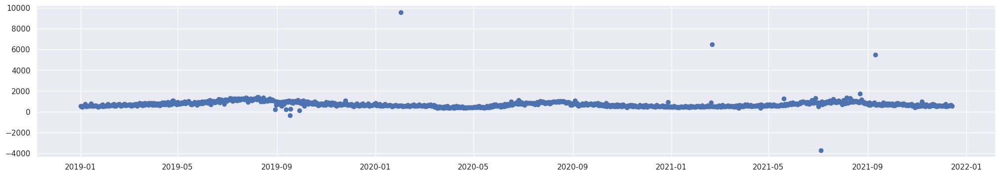

In [ ]:
zone = 'CASTELLDEFELS'
zone_data = data[data['ZONA']==zone]
sns.set(rc={'figure.figsize':(25, 4)})
plt.plot(zone_data.index, zone_data['CONSUM'], 'o')

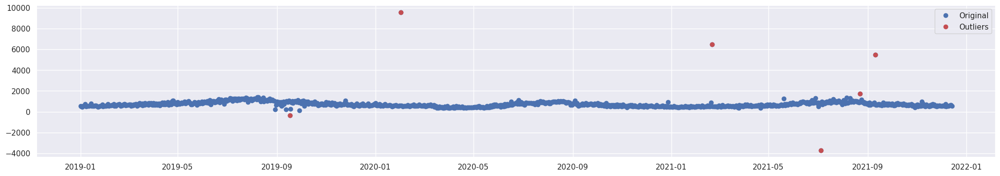

In [ ]:
#OUTLIER REMOVAL EXAMPLE
zone_df = zone_data
outliers = zone_df[(zone_df["CONSUM"] >= zone_df['CONSUM'].mean() + 2*zone_df['CONSUM'].std()) | (zone_df["CONSUM"] < 0)]

sns.set(rc={'figure.figsize':(25, 4)})
plt.plot(zone_data.index, zone_data['CONSUM'], 'o', label='Original')
plt.plot(outliers.index, outliers['CONSUM'], 'ro', label='Outliers')
plt.legend()
plt.show()




## Removing Outliers##

In [ ]:
for zone in data['ZONA'].unique():
  zone_df = data[data['ZONA'] == zone]
  outliers = zone_df[(zone_df["CONSUM"] >= zone_df['CONSUM'].mean() + 1*zone_df['CONSUM'].std()) | (zone_df["CONSUM"] < 0)]
  data = data[~data.isin(outliers)].dropna()

In [ ]:
for zone in data['ZONA'].unique():
  print(zone.ljust(30) + str(len(data[data['ZONA']==zone])))

SANT BOI                      1068
TORRELLES LLOBREGAT           1059
BADALONA                      1063
GAVA                          1075
CORNELLA                      1078
VILADECANS                    1075
BEGUES                        1025
L'HOSPITALET LLOBR.           1054
ESPLUGUES                     952
PALLEJA                       1076
MONTGAT                       1004
SANT JOAN DESPI               1073
SANT CUGAT                    1063
CASTELLDEFELS                 1027
CERDANYOLA                    995
STA.COLOMA GRAMENET           1032
SANT ADRIA                    1076
LA LLAGOSTA                   981
SANT CLIMENT LLOB.            1078
SANT FELIU LL.                1071
SANT JUST DESVERN             1067
EL PAPIOL                     933
BARCELONA                     1053
STA.COLOMA CERVELLO           949
MONTCADA I REIXAC             975
LES BOTIGUES SITGES           891
BADIA                         382
TIANA                         382
SABADELL                     

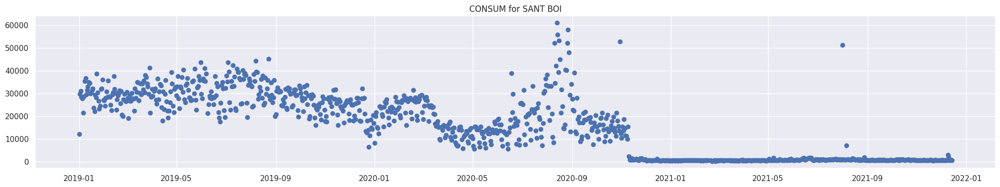

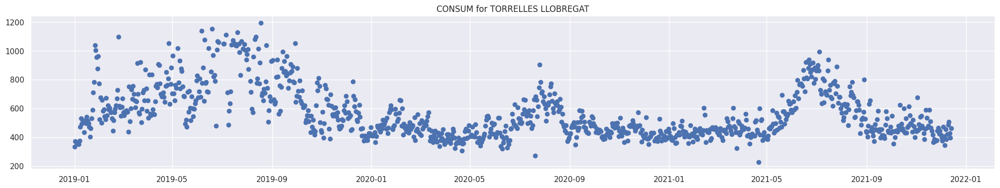

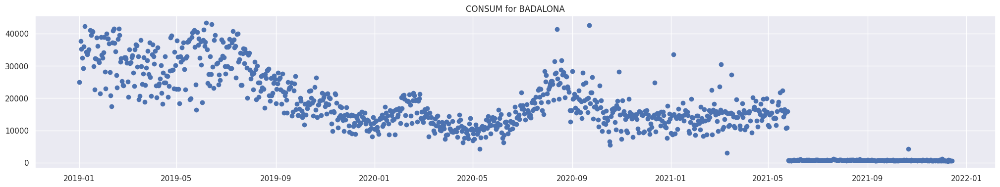

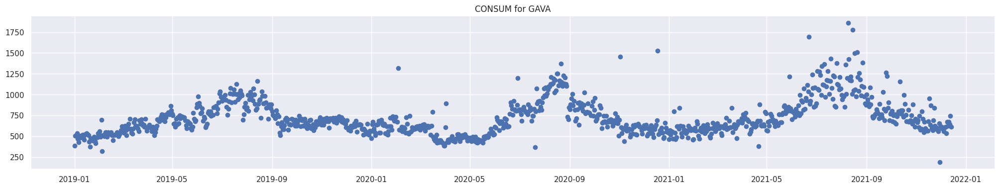

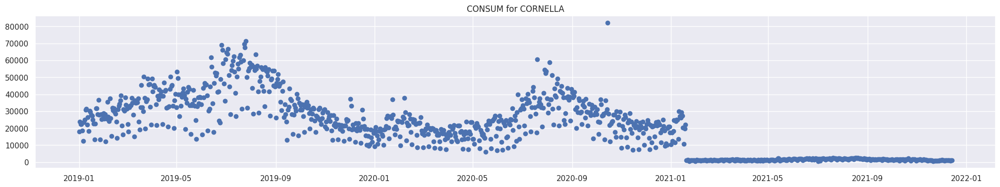

...

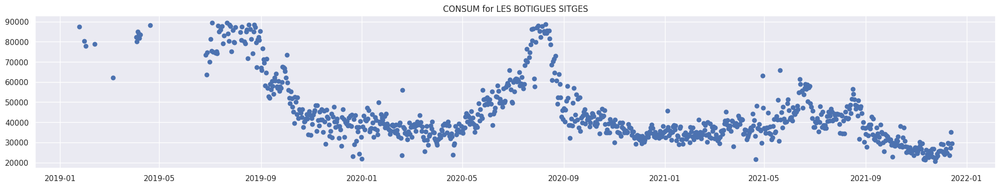

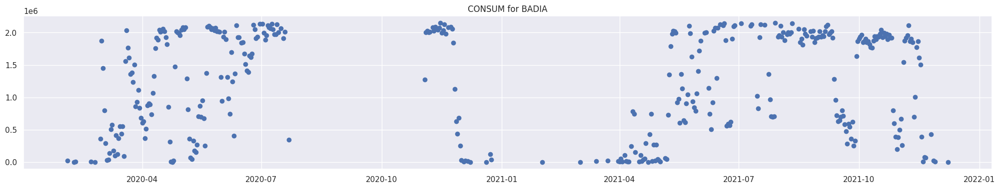

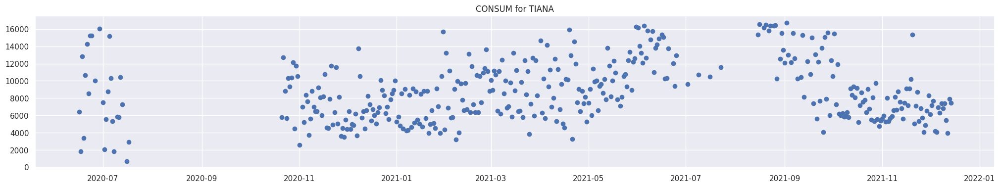

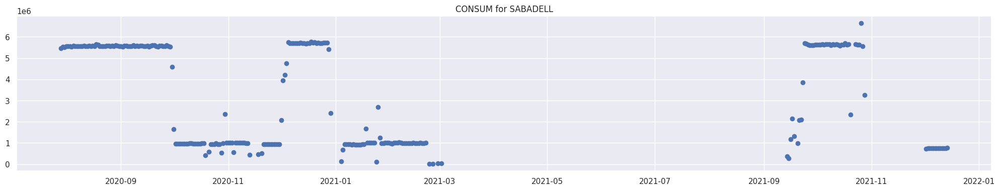

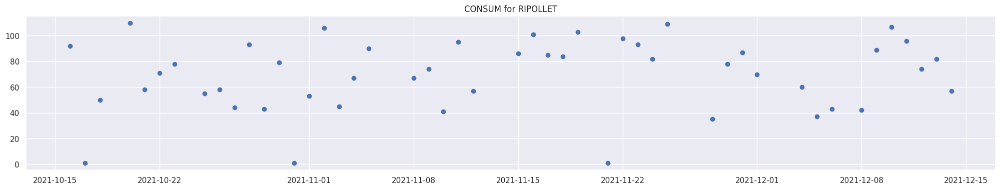

In [ ]:

date_range = pd.date_range(start='2019-01-01', end='2022-01-01', freq='D')

for zone in data['ZONA'].unique():
    zone_data = data[data['ZONA']==zone].reindex(date_range)
    plt.plot(zone_data.index, zone_data['CONSUM'], 'o')
    plt.title(f"CONSUM for {zone}")
    plt.show()

## Visual analysis of selected area (after removing outliers)

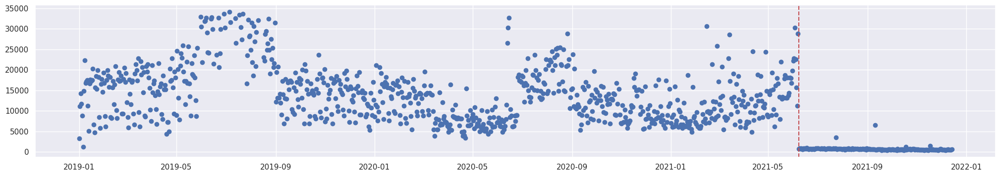

In [ ]:
zone = 'STA.COLOMA GRAMENET'
zone_data = data[data['ZONA']==zone]


date_range = pd.date_range(start='2019-01-01', end='2022-01-01', freq='D')


zone_data = zone_data.reindex(date_range)

#Plot
sns.set(rc={'figure.figsize':(25, 4)})
plt.plot(zone_data.index, zone_data['CONSUM'], 'o')
plt.axvline(pd.to_datetime('2021-06-08'), color='r', linestyle='--', label = "End of 1st Covid Lockdown")

## 4 pt moving median to fill NaN Values##

In [ ]:
def plot_zone_estimated(zone):
  #Plot the resulting 'CONSUM' data for the zone and add a title indicating the zone
  plt.plot(zone_data[zone_data['Estimated']==0].index, zone_data[zone_data['Estimated']==0]['CONSUM'], 'bo', label = "Original")
  plt.plot(zone_data[zone_data['Estimated']==1].index, zone_data[zone_data['Estimated']==1]['CONSUM'], 'ro', label = "Estimated")
  #plt.axvline(pd.to_datetime('2020-03-14'), color='r', linestyle='--', label = "1st Covid Lockdown")
  #plt.axvline(pd.to_datetime('2020-06-21'), color='r', linestyle='--', label = "End of 1st Covid Lockdown")
  plt.title(f"CONSUM for Zone {zone}")
  plt.legend()
  plt.show()

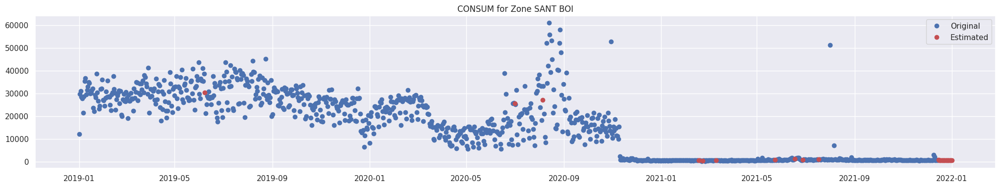

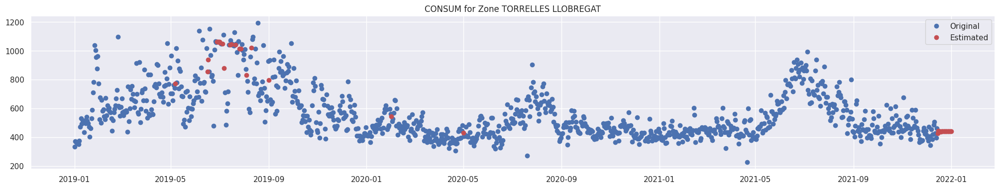

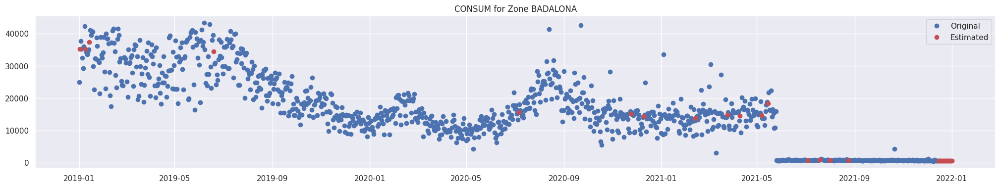

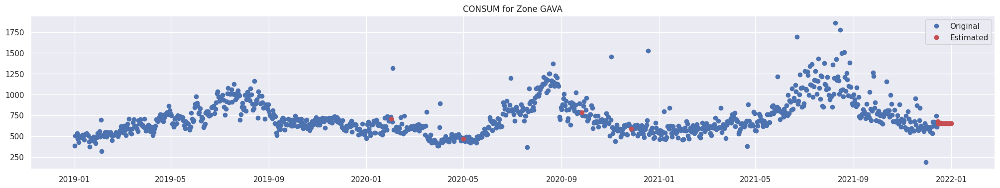

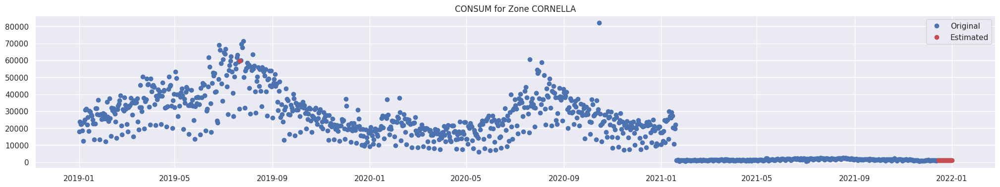

...

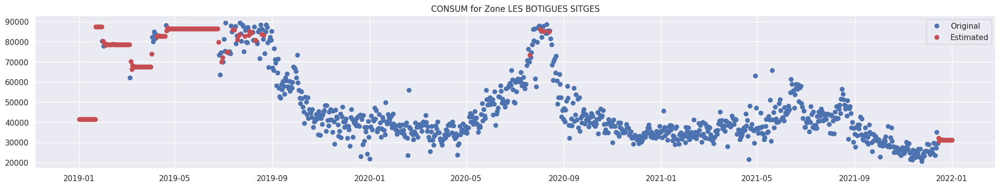

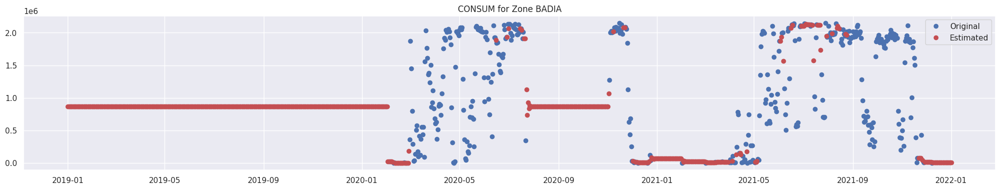

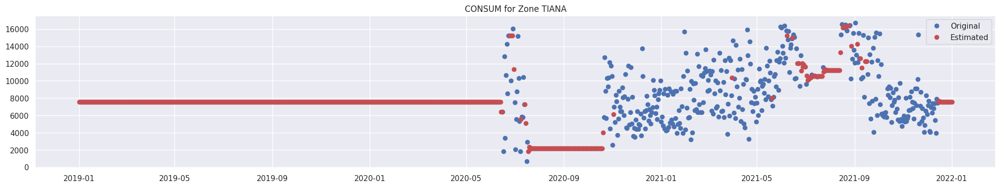

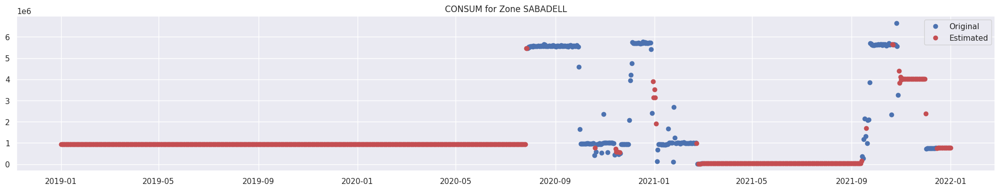

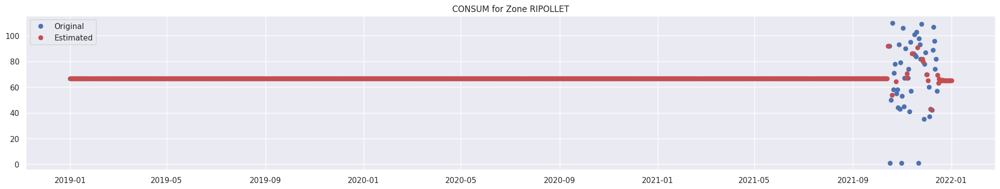

In [ ]:

date_range = pd.date_range(start='2019-01-01', end='2022-01-01', freq='D')

zone_data_list = []


for zone in data['ZONA'].unique():
    zone_data = data[data['ZONA']==zone].reindex(date_range)


    zone_data['Estimated'] = zone_data['CONSUM'].isna().astype(int)

    # Fill remaining NaN values in the 'CONSUM' column with the median of the 2 previous and 2 next non-NaN values
    for i in range(len(zone_data)):
        if zone_data.iloc[i]['Estimated'] == 1:
            window = zone_data['CONSUM'].iloc[max(0, i-2) : min(len(zone_data), i+3)].median()
            zone_data['CONSUM'].iloc[i] = window
            zone_data['ZONA'] = zone

    #For values that don't have 2 previous and two next, we fill them with the median value
    # Calculate the median consumption for the "CONSUM" column
    consum_median = zone_data["CONSUM"].median()
    zone_data["CONSUM"].fillna(consum_median, inplace=True)

    zone_data_list.append(zone_data)

    plot_zone_estimated(zone)

all_zone_data = pd.concat(zone_data_list)

In [ ]:
all_zone_data

,ZONA,CONSUM,Estimated
2019-01-01,SANT BOI,12036.000000,0
2019-01-02,SANT BOI,29684.000000,0
2019-01-03,SANT BOI,31067.000000,0
2019-01-04,SANT BOI,28333.000000,0
2019-01-05,SANT BOI,27735.000000,0
...,...,...,...
2021-12-28,RIPOLLET,65.332825,1
2021-12-29,RIPOLLET,65.333588,1
2021-12-30,RIPOLLET,65.333206,1
2021-12-31,RIPOLLET,65.333397,1


## Feature engineering: Adding columns

In [ ]:
all_zone_data['DAY'] = all_zone_data.index.day
all_zone_data['MONTH'] = all_zone_data.index.month
all_zone_data['YEAR'] = all_zone_data.index.year
all_zone_data['WEEKDAY_NUM'] = all_zone_data.index.weekday
all_zone_data['IS_WEEKEND'] = ((all_zone_data['WEEKDAY_NUM'] == 5) | (all_zone_data['WEEKDAY_NUM'] == 6)).astype(int)

all_zone_data.head()


,ZONA,CONSUM,Estimated,DAY,MONTH,YEAR,WEEKDAY_NUM,IS_WEEKEND
2019-01-01,SANT BOI,12036.0,0,1,1,2019,1,0
2019-01-02,SANT BOI,29684.0,0,2,1,2019,2,0
2019-01-03,SANT BOI,31067.0,0,3,1,2019,3,0
2019-01-04,SANT BOI,28333.0,0,4,1,2019,4,0
2019-01-05,SANT BOI,27735.0,0,5,1,2019,5,1


## Scaling areas according to mean

In [ ]:
dades_municipi = pd.read_csv("/content/drive/MyDrive/TFG/dades_municipi.csv", header=0)
dades_municipi["Consum Total"] = dades_municipi["Consum_persona_dia"] * dades_municipi['Poblacio']

In [ ]:
for zone in all_zone_data['ZONA'].unique():
    zone_data = all_zone_data[all_zone_data['ZONA'] == zone]
    scaling_factor = dades_municipi[dades_municipi['Municipi'] == zone]['Consum_persona_dia'].mean() / zone_data['CONSUM'].mean()
    all_zone_data.loc[all_zone_data['ZONA'] == zone, 'CONSUM'] *= scaling_factor


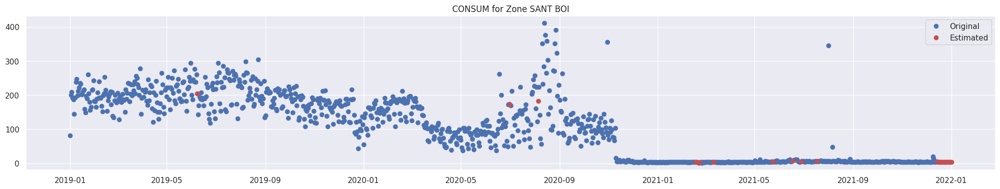

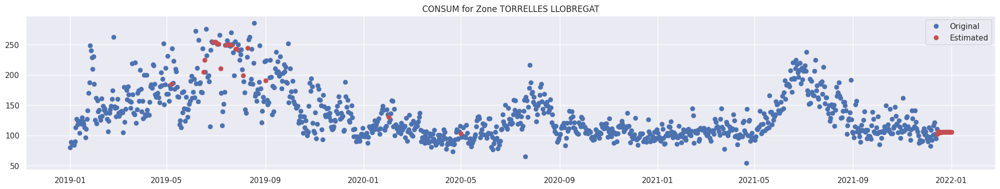

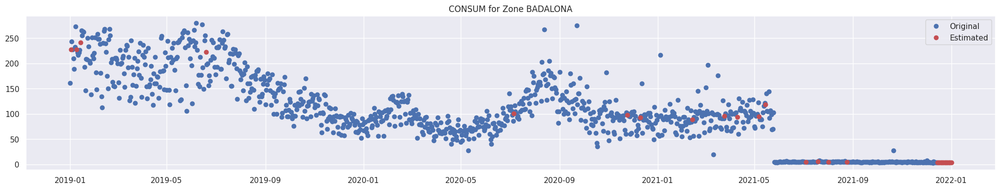

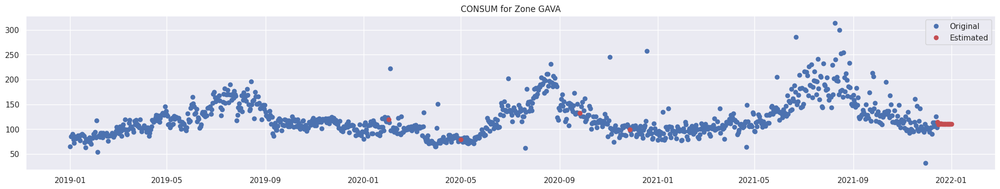

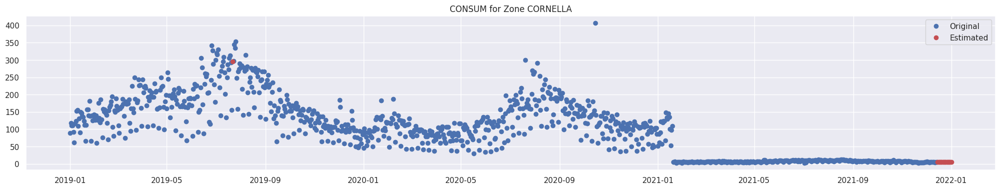

...

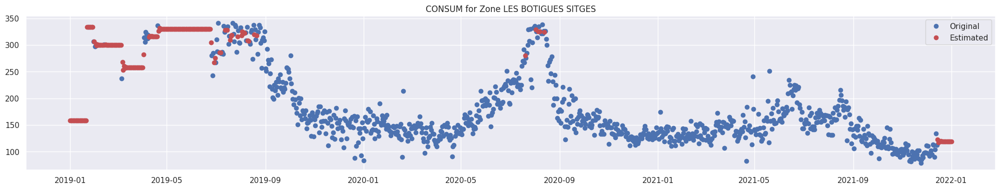

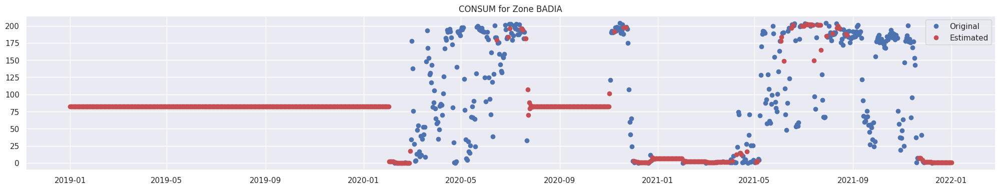

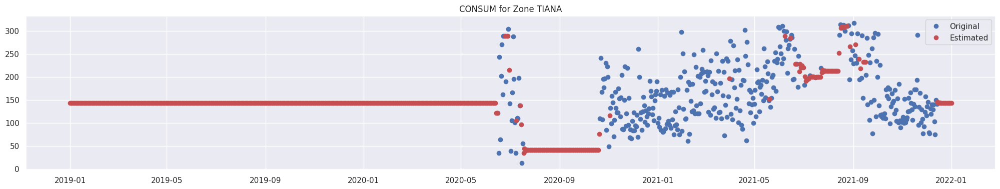

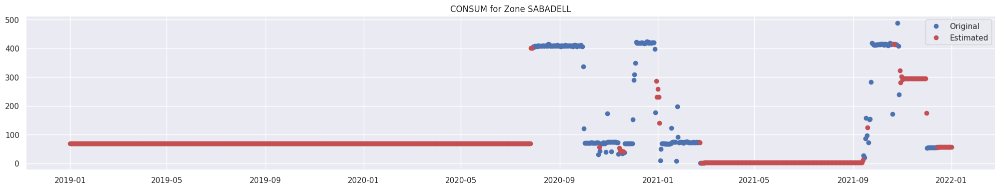

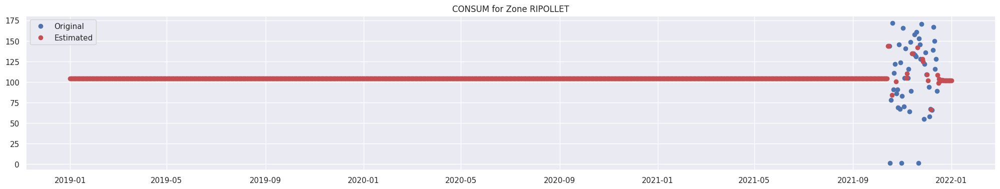

In [ ]:
for zone in all_zone_data["ZONA"].unique():

  zone_data = all_zone_data[all_zone_data['ZONA']==zone]

  plt.figure(figsize=(25, 4))

  original_points = zone_data[zone_data['Estimated'] == 0]
  plt.plot(original_points.index, original_points['CONSUM'], 'bo', label='Original')

  estimated_points = zone_data[zone_data['Estimated'] == 1]
  plt.plot(estimated_points.index, estimated_points['CONSUM'], 'ro', label='Estimated')
  plt.title(f"CONSUM for Zone {zone}")

  plt.legend()
  plt.show()

## Visual analysis of selected area (after cleaning)

Text(0.5, 1.0, 'CONSUM for STA.COLOMA GRAMENET')

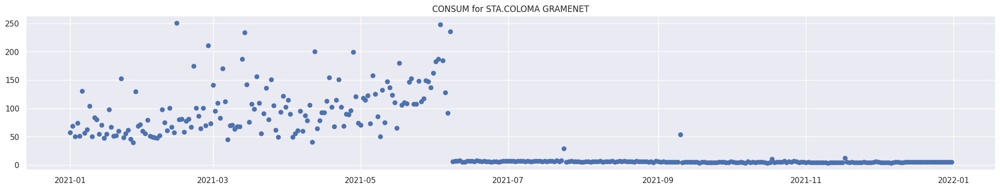

In [ ]:
zone = 'STA.COLOMA GRAMENET'
zone_data = all_zone_data[all_zone_data['ZONA']==zone]

start_date = '2021-01-01'
end_date = '2021-12-31'
zone_data_year = zone_data.loc[start_date:end_date]

plt.plot(zone_data_year.index, zone_data_year['CONSUM'], 'o')
plt.title(f"CONSUM for {zone}")

## First Visual Analysis to assess normality

In [ ]:
def shapiro_wilk_test(zone_data):
  consum_series = zone_data['CONSUM']
  statistic, p_value = shapiro(consum_series)

  print(f"Shapiro-Wilk test statistic: {statistic:.4f}")
  print(f"p-value: {p_value:.4f}")
  if p_value > 0.05:
      print("The 'CONSUM' series is likely normally distributed.")
  else:
      print("The 'CONSUM' series is likely not normally distributed.")

SANT BOI
Shapiro-Wilk test statistic: 0.8797
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


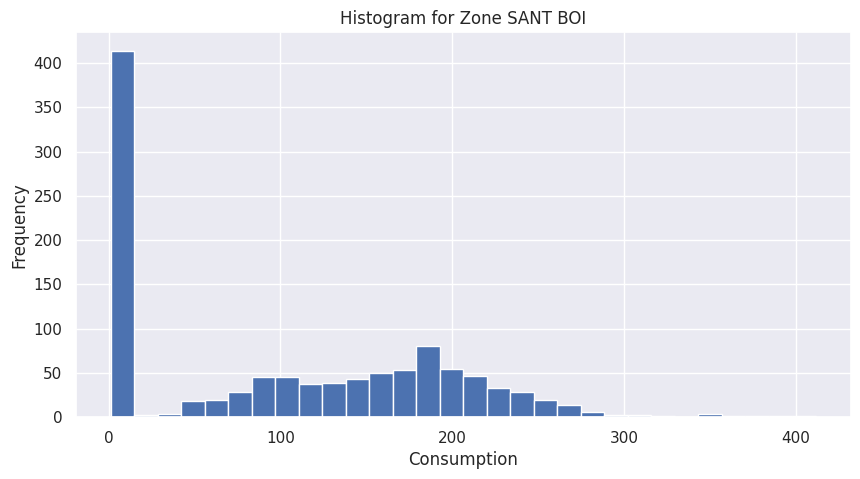

TORRELLES LLOBREGAT
Shapiro-Wilk test statistic: 0.8830
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


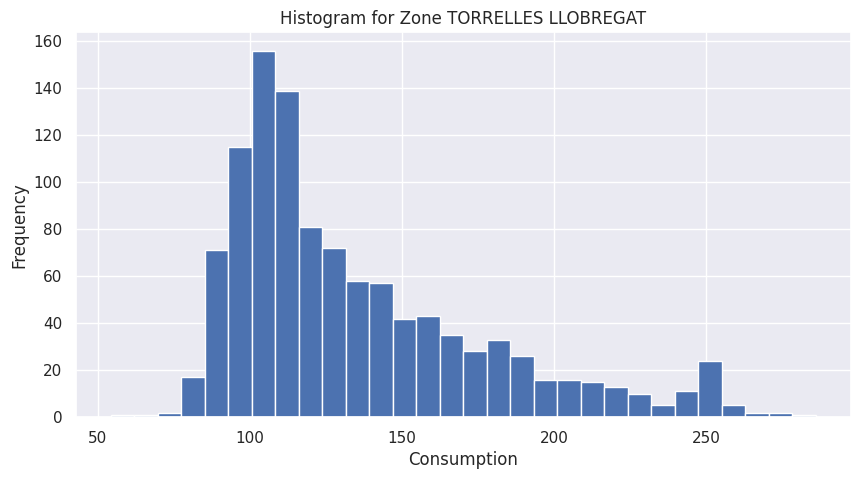

BADALONA
Shapiro-Wilk test statistic: 0.9431
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


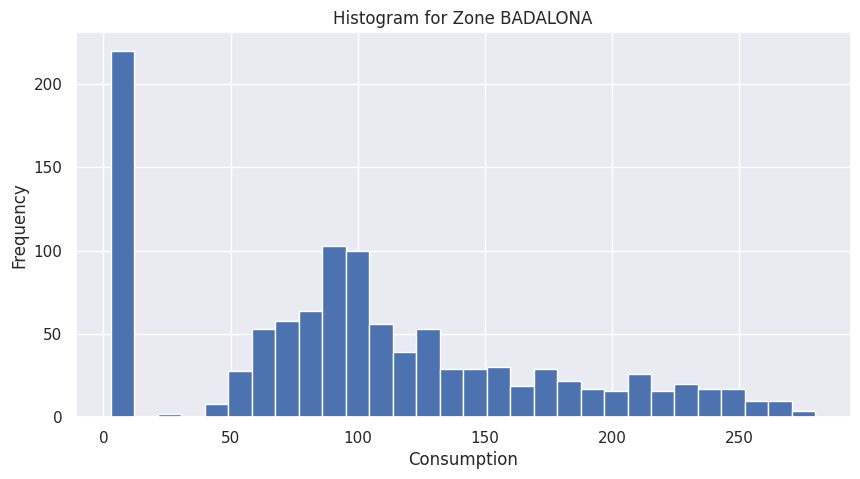

GAVA
Shapiro-Wilk test statistic: 0.9067
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


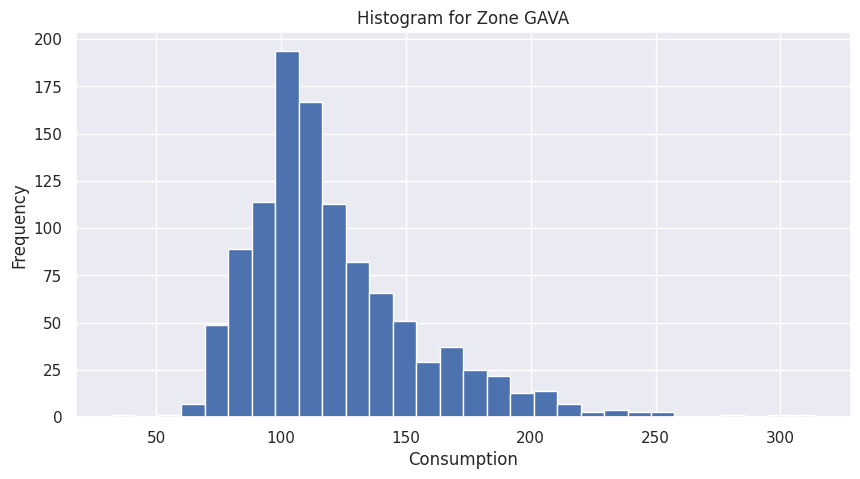

CORNELLA
Shapiro-Wilk test statistic: 0.9164
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


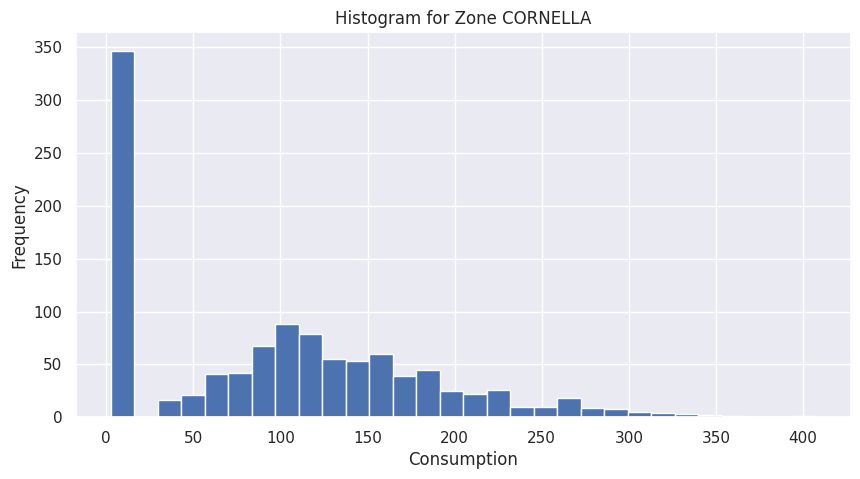

VILADECANS
Shapiro-Wilk test statistic: 0.8972
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


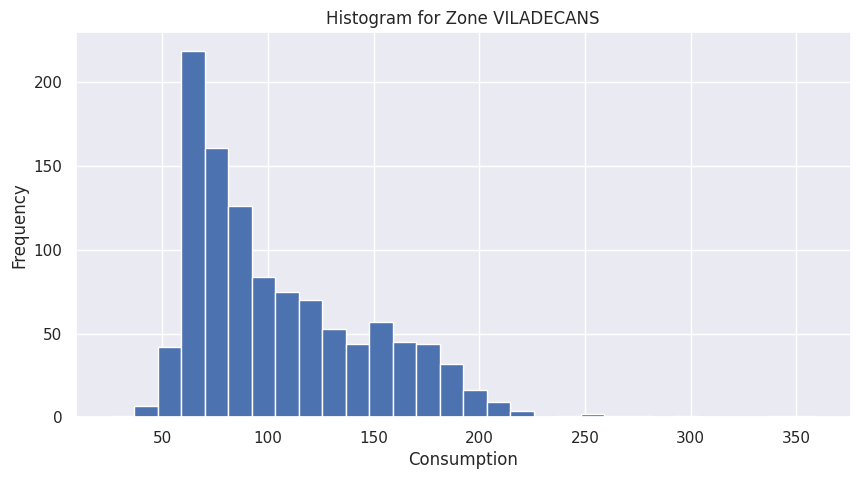

BEGUES
Shapiro-Wilk test statistic: 0.9476
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


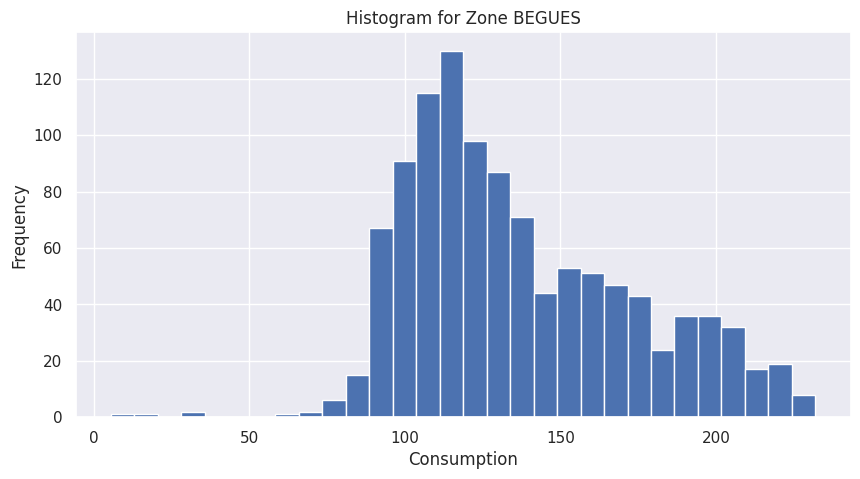

L'HOSPITALET LLOBR.
Shapiro-Wilk test statistic: 0.9452
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


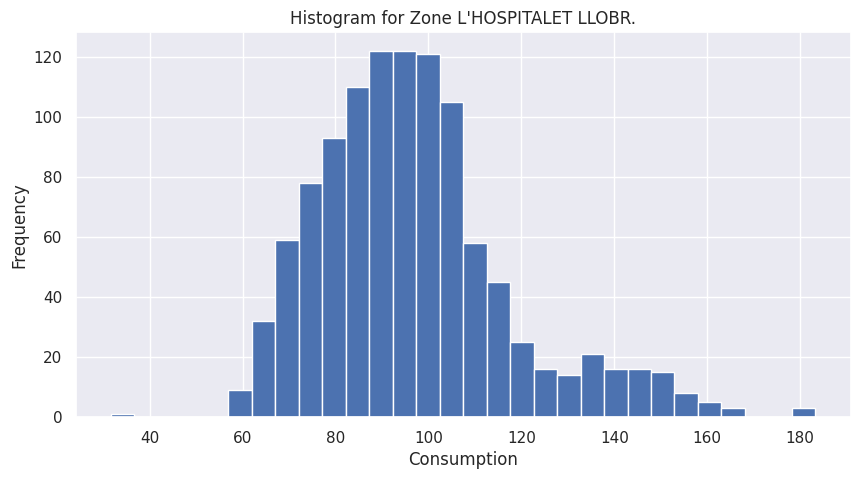

ESPLUGUES
Shapiro-Wilk test statistic: 0.9672
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


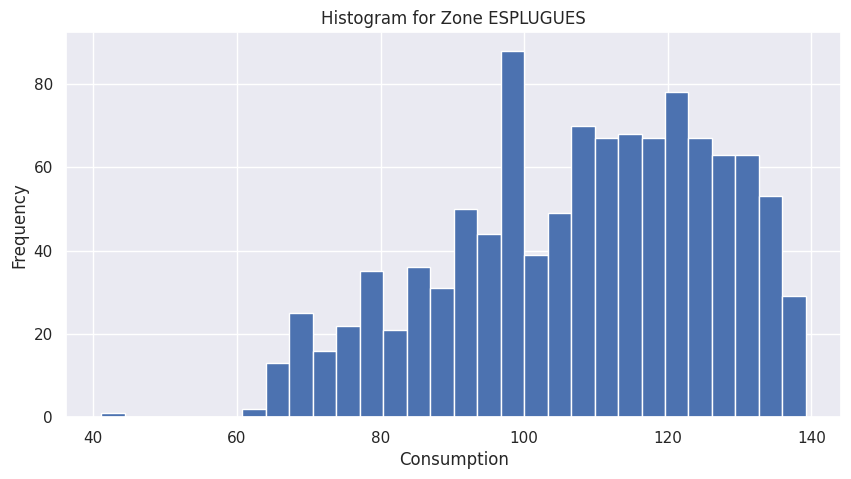

PALLEJA
Shapiro-Wilk test statistic: 0.9374
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


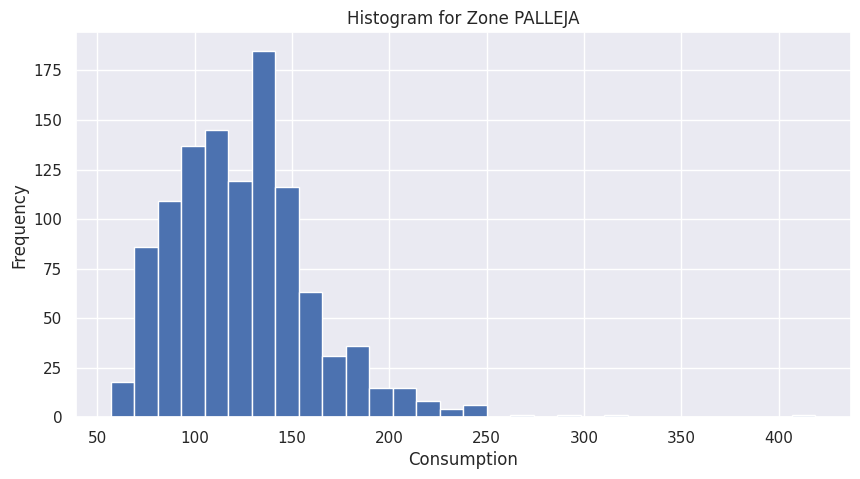

MONTGAT
Shapiro-Wilk test statistic: 0.9799
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


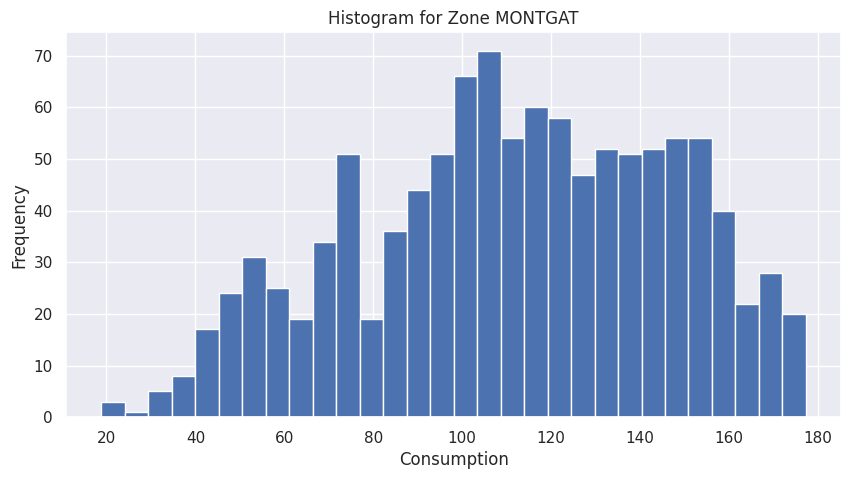

SANT JOAN DESPI
Shapiro-Wilk test statistic: 0.9873
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


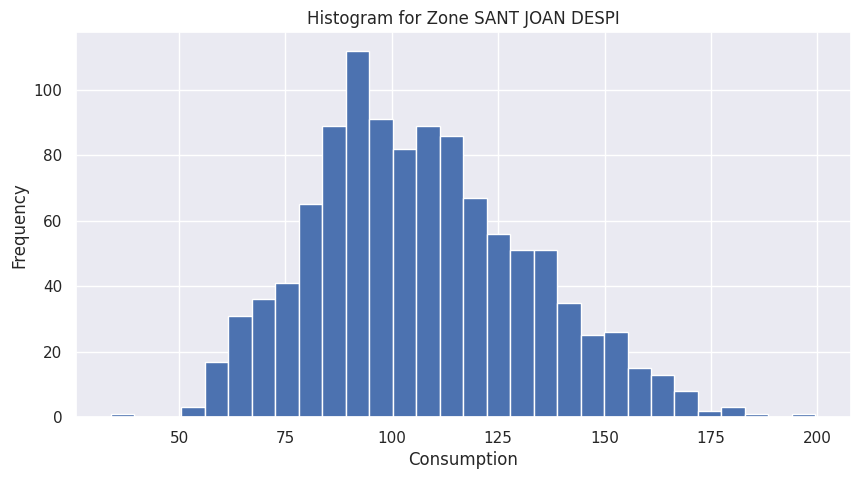

SANT CUGAT
Shapiro-Wilk test statistic: 0.9802
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


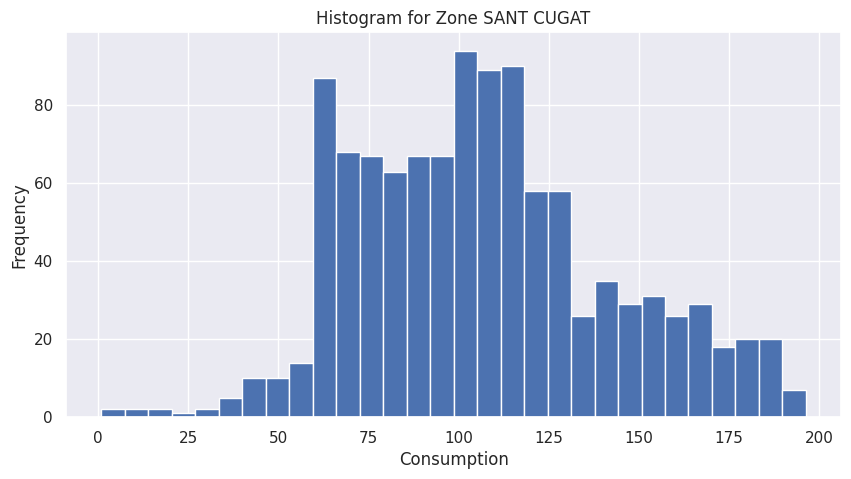

CASTELLDEFELS
Shapiro-Wilk test statistic: 0.9627
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


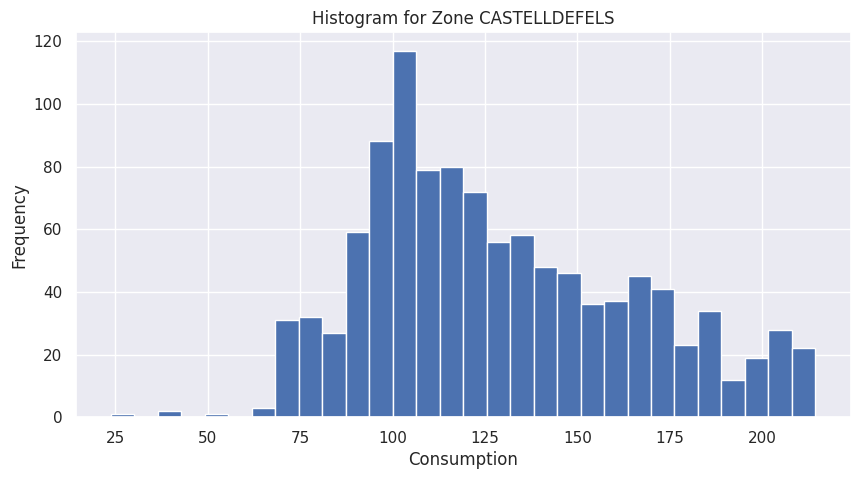

CERDANYOLA
Shapiro-Wilk test statistic: 0.8880
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


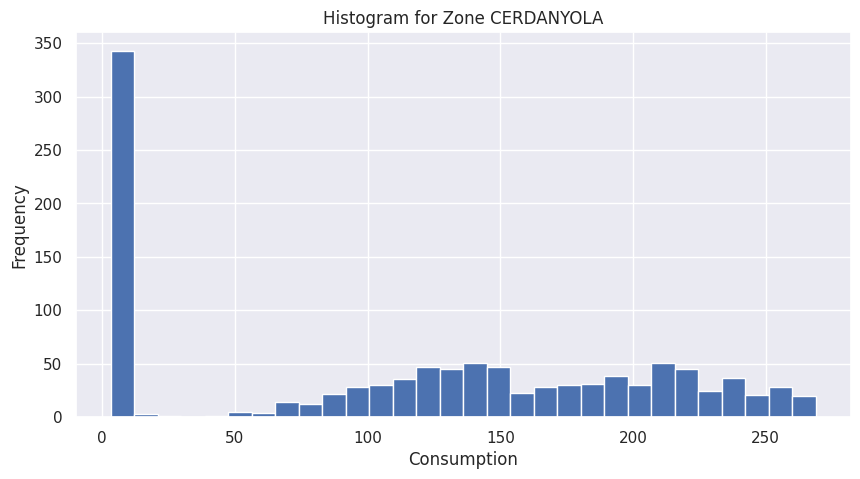

STA.COLOMA GRAMENET
Shapiro-Wilk test statistic: 0.9483
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


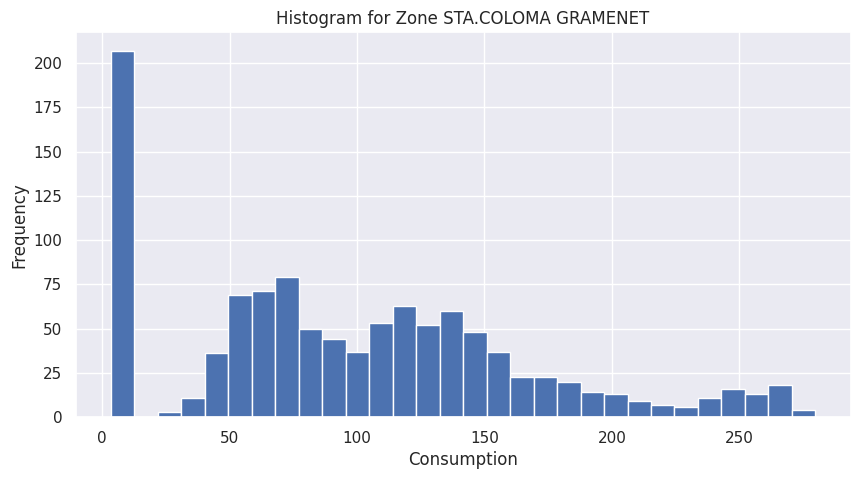

SANT ADRIA
Shapiro-Wilk test statistic: 0.9834
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


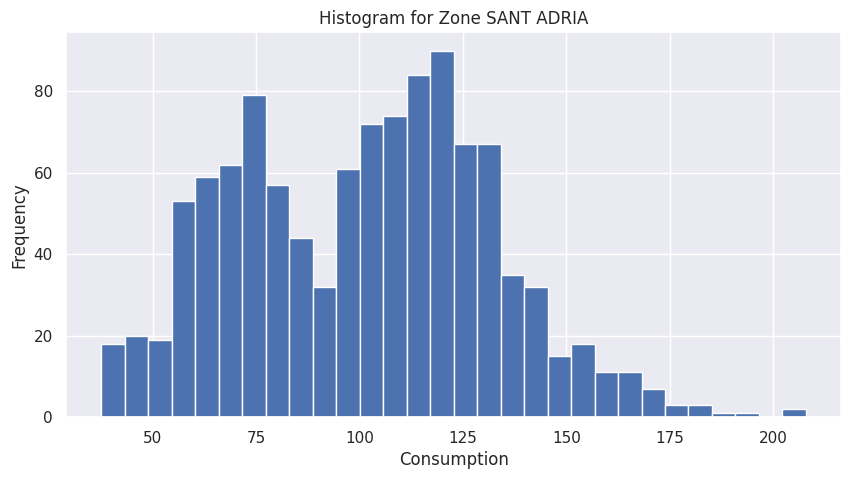

LA LLAGOSTA
Shapiro-Wilk test statistic: 0.9342
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


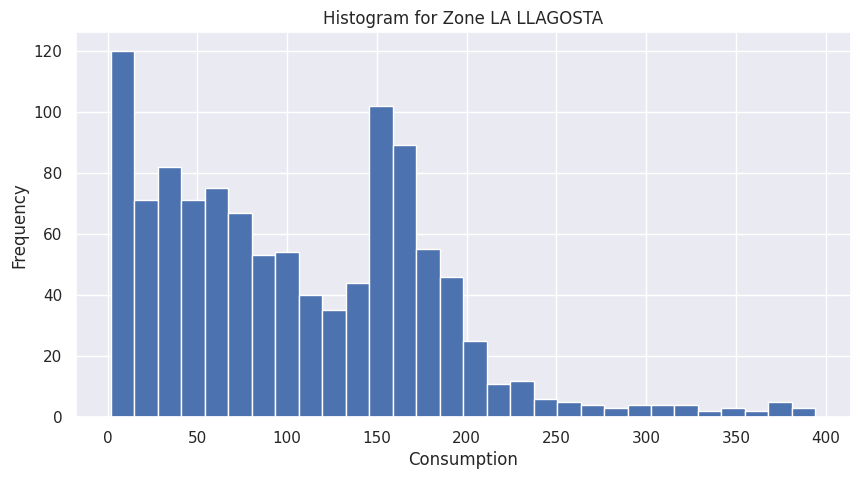

SANT CLIMENT LLOB.
Shapiro-Wilk test statistic: 0.7677
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


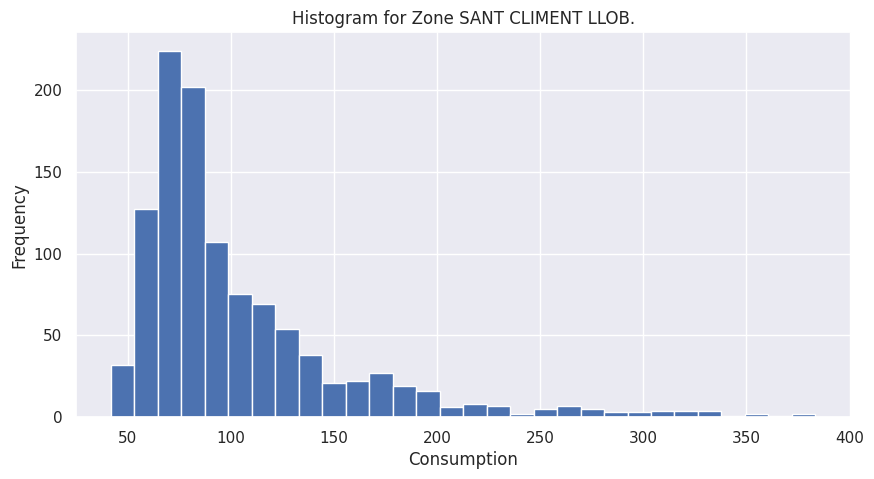

SANT FELIU LL.
Shapiro-Wilk test statistic: 0.7399
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


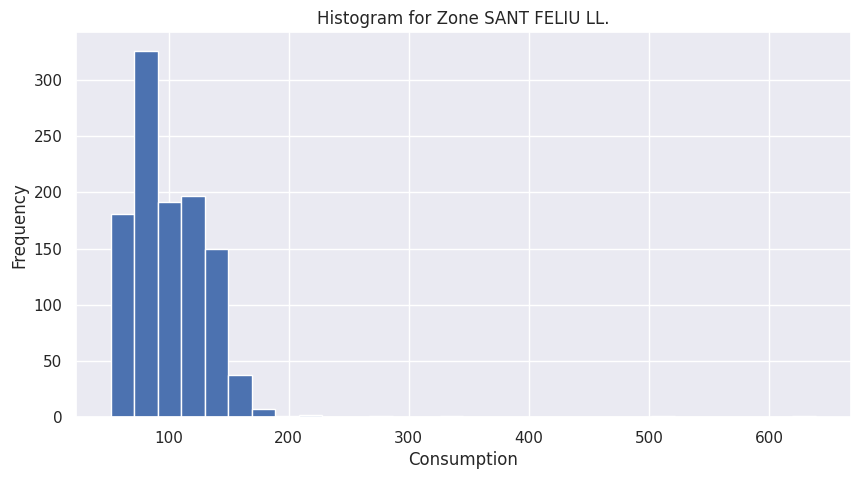

SANT JUST DESVERN
Shapiro-Wilk test statistic: 0.9727
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


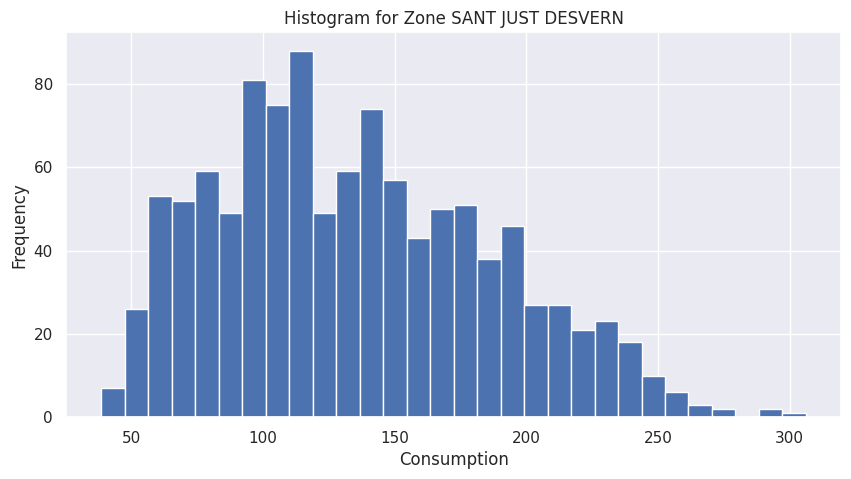

EL PAPIOL
Shapiro-Wilk test statistic: 0.9766
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


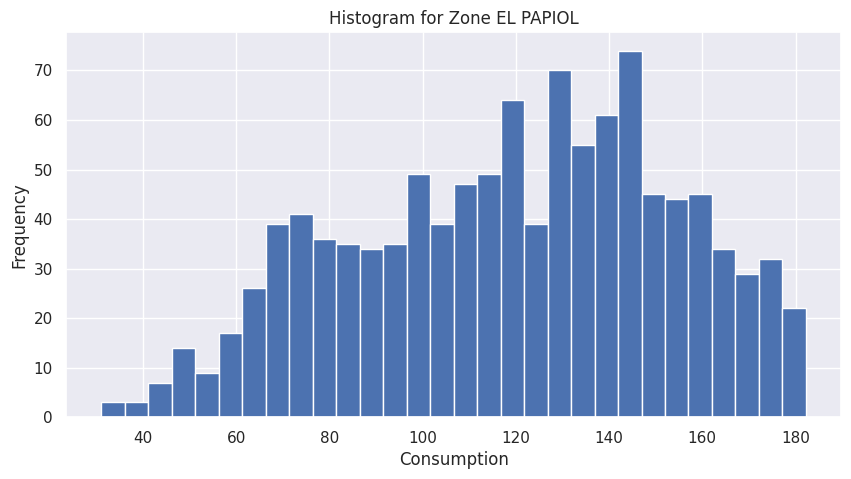

BARCELONA
Shapiro-Wilk test statistic: 0.8117
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


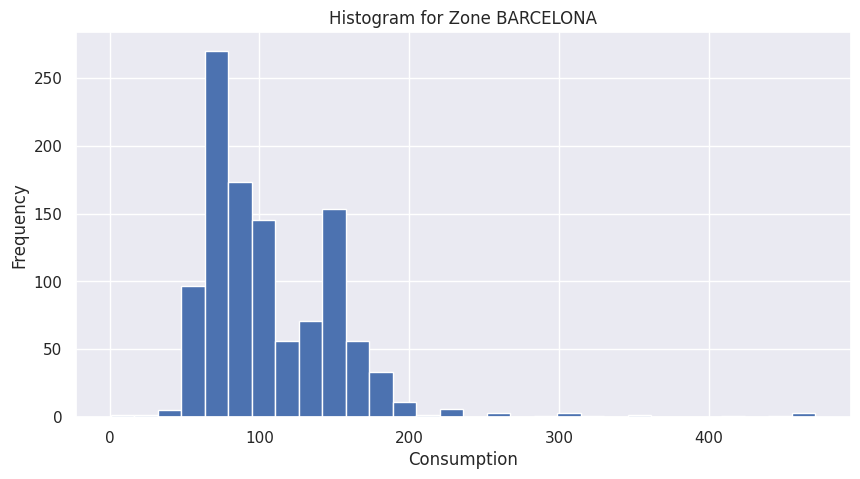

STA.COLOMA CERVELLO
Shapiro-Wilk test statistic: 0.7242
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


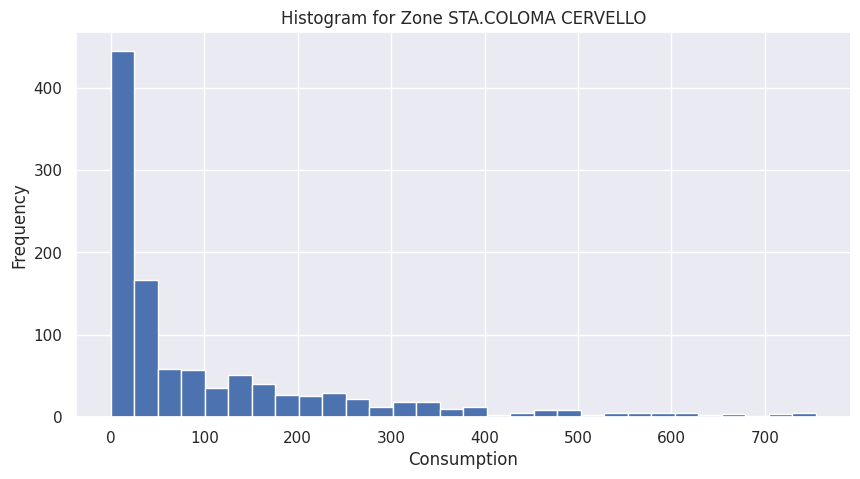

MONTCADA I REIXAC
Shapiro-Wilk test statistic: 0.9772
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


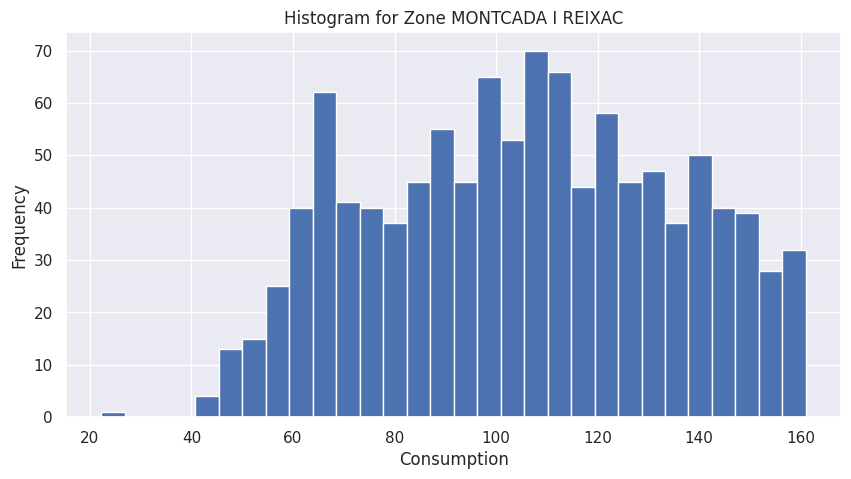

LES BOTIGUES SITGES
Shapiro-Wilk test statistic: 0.8583
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


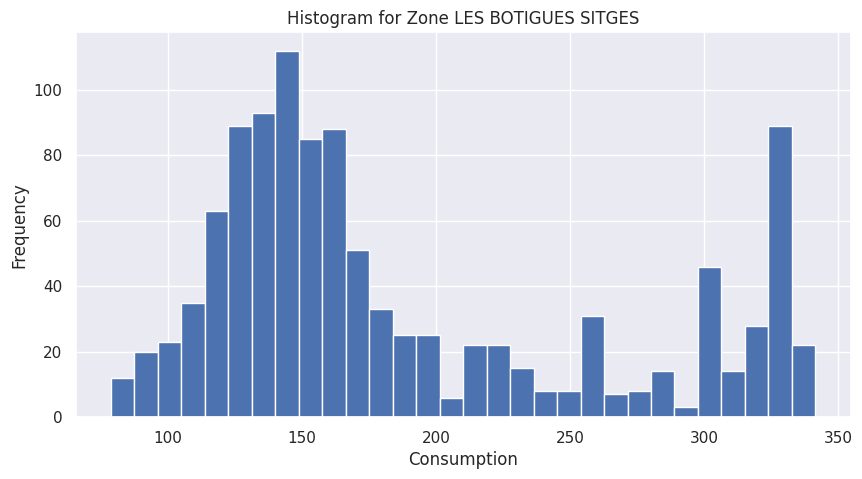

BADIA
Shapiro-Wilk test statistic: 0.8561
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


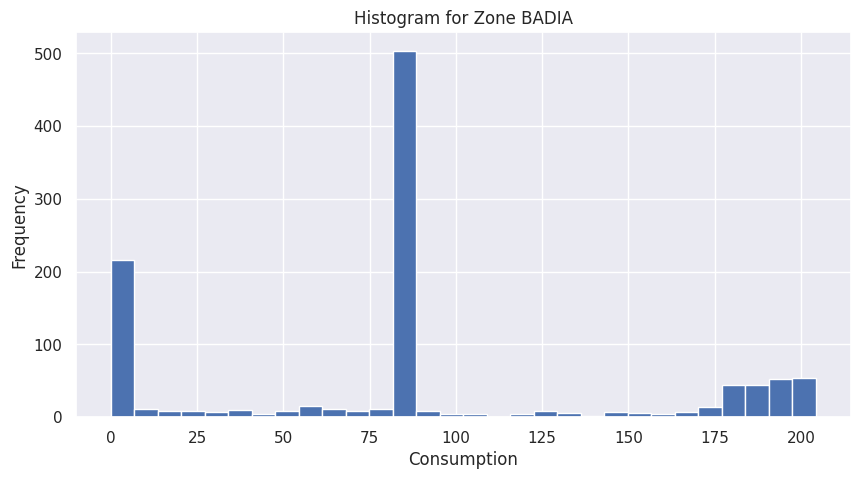

TIANA
Shapiro-Wilk test statistic: 0.8634
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


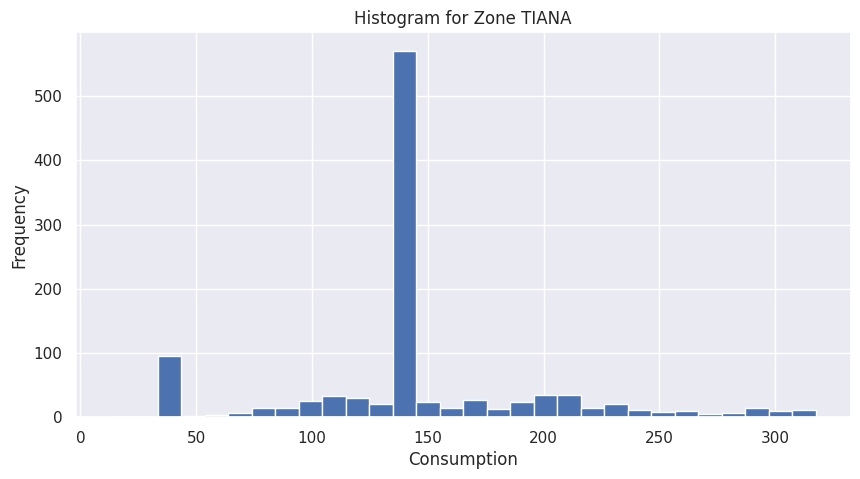

SABADELL
Shapiro-Wilk test statistic: 0.6106
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


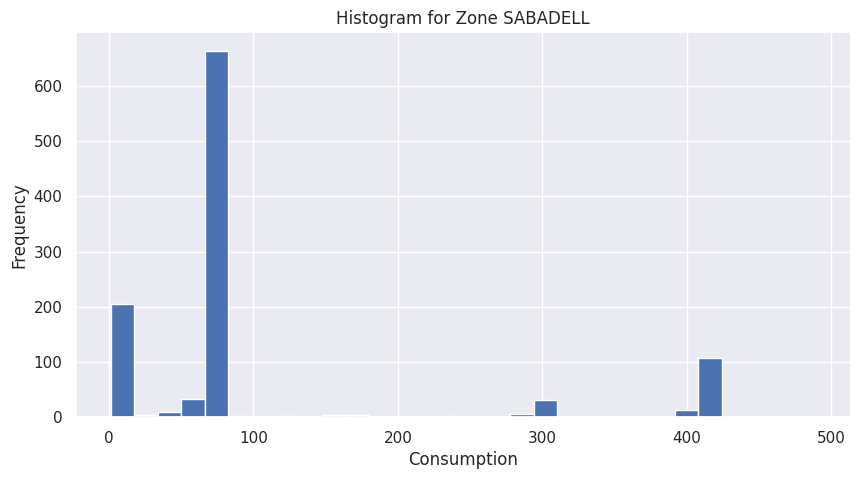

RIPOLLET
Shapiro-Wilk test statistic: 0.2434
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


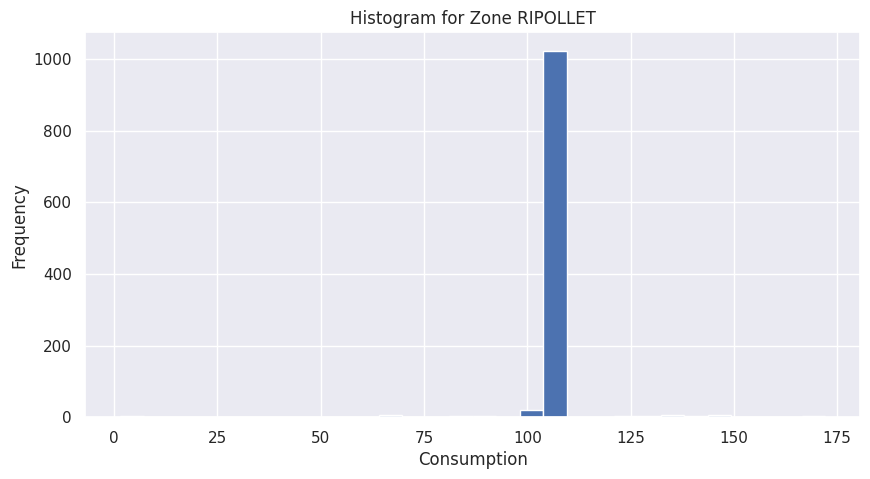

In [ ]:
for zone in all_zone_data['ZONA'].unique():
  zone_data = all_zone_data[all_zone_data['ZONA']== zone]
  print(zone)
  shapiro_wilk_test(zone_data)

  sns.set(rc={'figure.figsize':(10, 5)})
  plt.hist(zone_data['CONSUM'], bins=30)
  plt.xlabel('Consumption')
  plt.ylabel('Frequency')
  plt.title(f"Histogram for Zone {zone}")
  plt.show()

## Scaling corrupted values with factor

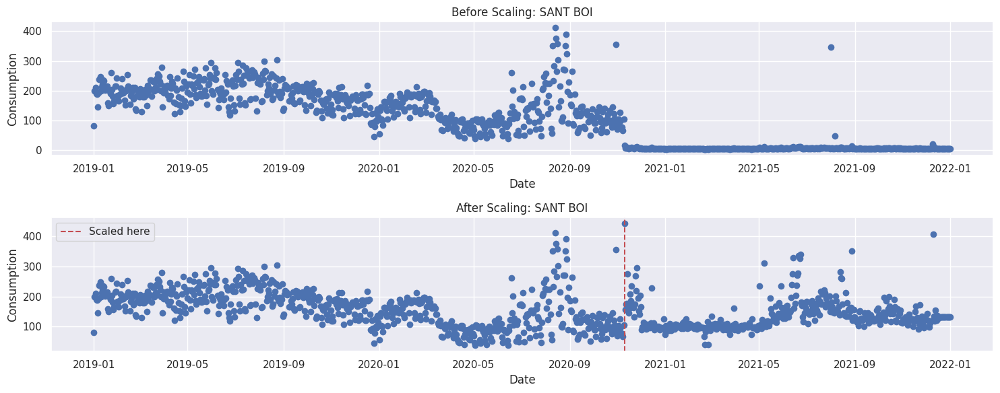

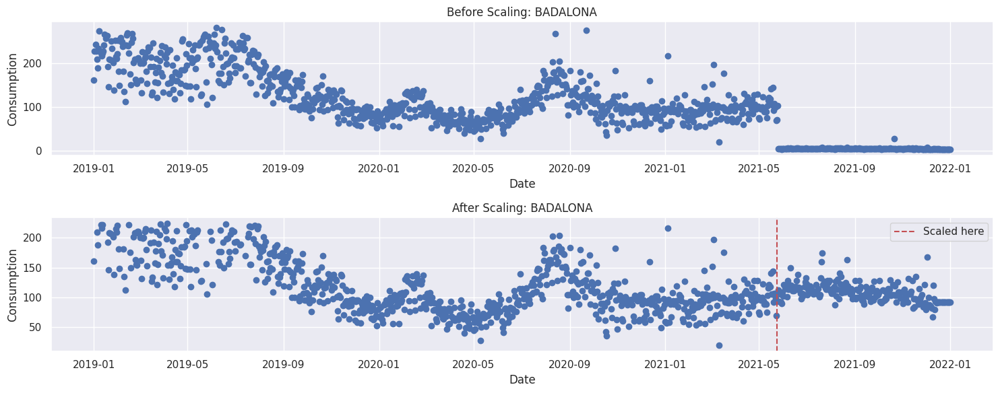

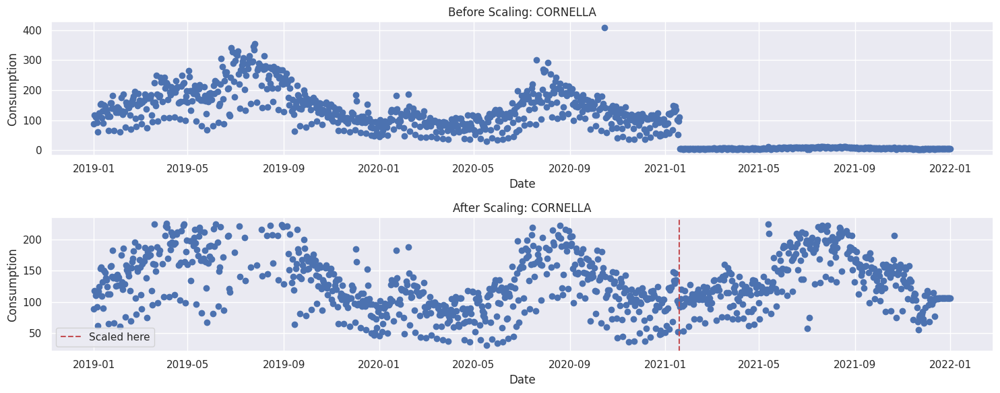

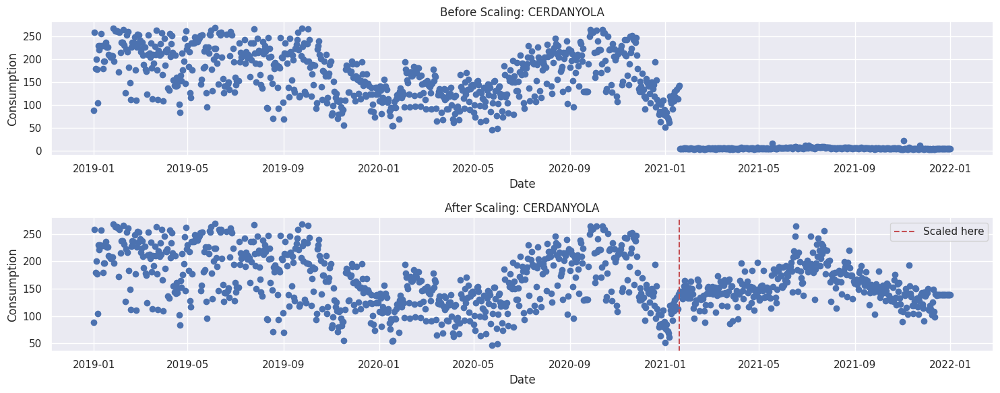

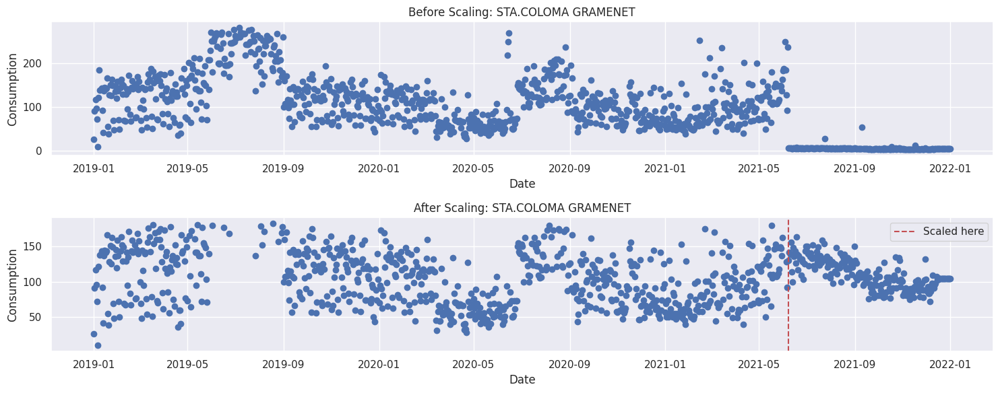

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

zones_to_scale = {'SANT BOI': '2020-11-10', 'BADALONA': '2021-05-24', 'CORNELLA': '2021-01-19', 'CERDANYOLA': '2021-01-19', 'STA.COLOMA GRAMENET':'2021-06-08'}

for zone, date in zones_to_scale.items():
    zone_data_no_scale = all_zone_data[all_zone_data['ZONA'] == zone]
    zone_data = all_zone_data[all_zone_data['ZONA'] == zone] # data without scaling

    mean_before = zone_data[zone_data.index < date]['CONSUM'].mean()
    mean_after = zone_data[zone_data.index >= date]['CONSUM'].mean()
    scaling_factor = mean_before / mean_after
    zone_data.loc[zone_data.index >= date, 'CONSUM'] *= scaling_factor

    outliers = zone_data[
        (zone_data["CONSUM"] >= zone_data['CONSUM'].mean() + 1 * zone_data['CONSUM'].std()) | (zone_data["CONSUM"] < 0)
    ]
    zone_data = zone_data[~zone_data.isin(outliers)].dropna()  # data after scaling

    # Plotting before scaling
    plt.figure(figsize=(15, 6))
    plt.subplot(2, 1, 1)
    plt.plot(zone_data_no_scale.index, zone_data_no_scale['CONSUM'], 'bo')
    plt.title(f'Before Scaling: {zone}')
    plt.xlabel('Date')
    plt.ylabel('Consumption')

    # Plotting after scaling
    plt.subplot(2, 1, 2)
    plt.plot(zone_data.index, zone_data['CONSUM'], 'bo')
    plt.title(f'After Scaling: {zone}')
    plt.xlabel('Date')
    plt.ylabel('Consumption')

    plt.axvline(pd.to_datetime(date), color='r', linestyle='--', label="Scaled here")
    plt.legend()

    plt.tight_layout()
    plt.show()

    all_zone_data = all_zone_data[all_zone_data['ZONA'] != zone]
    all_zone_data = pd.concat([all_zone_data, zone_data])


## Standardization with z-score and normality test

TORRELLES LLOBREGAT
Shapiro-Wilk test statistic: 0.8830
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


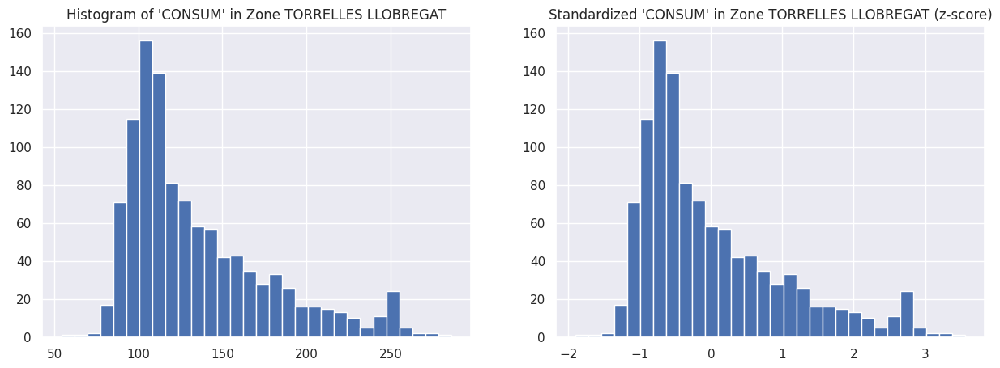

GAVA
Shapiro-Wilk test statistic: 0.9067
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


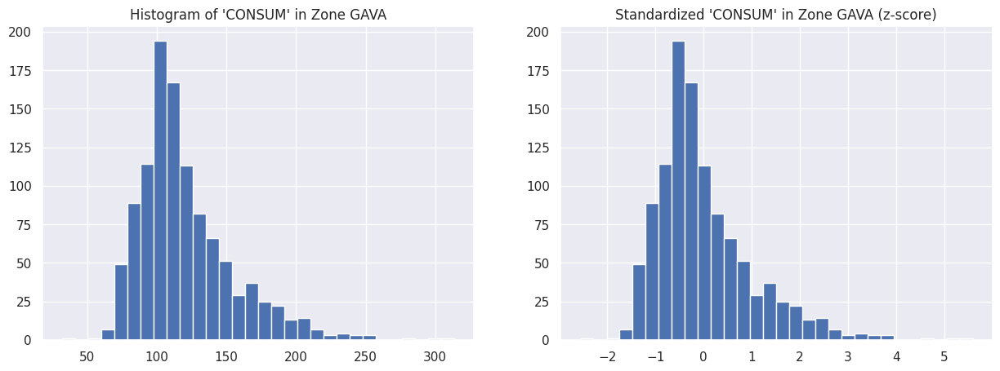

VILADECANS
Shapiro-Wilk test statistic: 0.8972
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


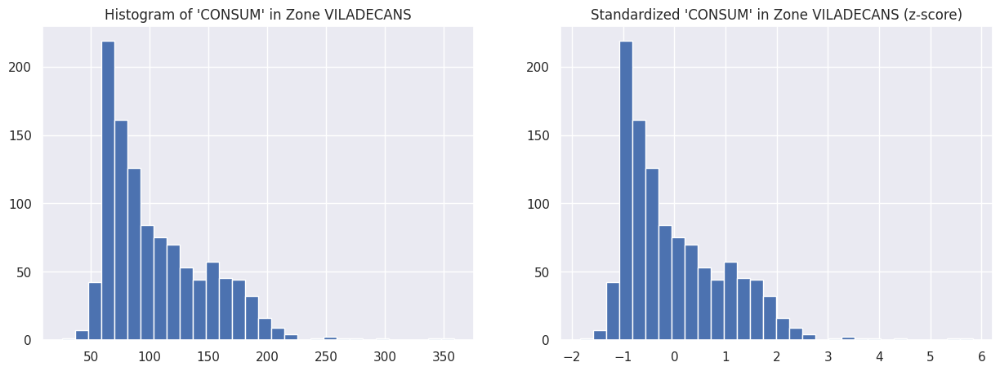

BEGUES
Shapiro-Wilk test statistic: 0.9476
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


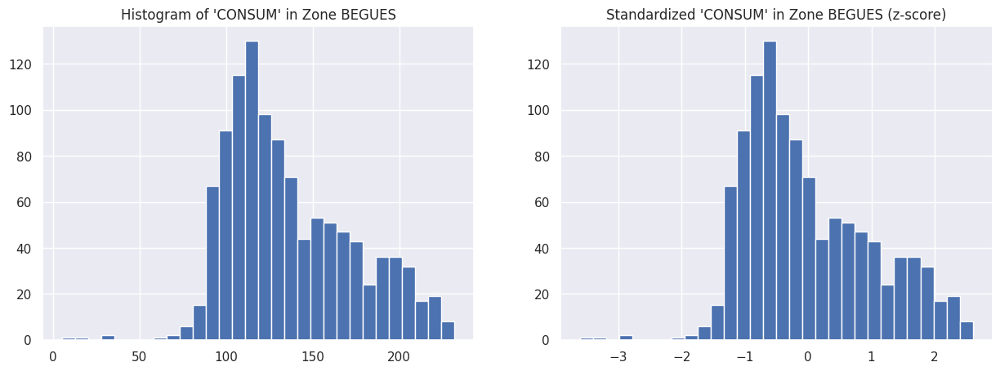

L'HOSPITALET LLOBR.
Shapiro-Wilk test statistic: 0.9452
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


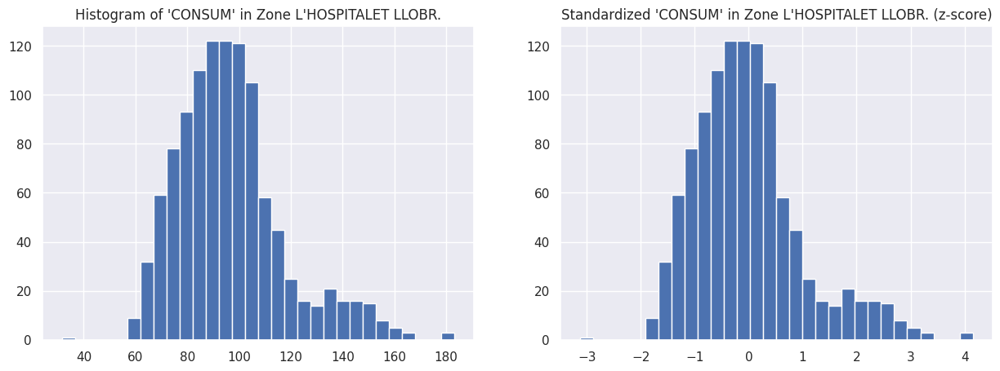

ESPLUGUES
Shapiro-Wilk test statistic: 0.9672
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


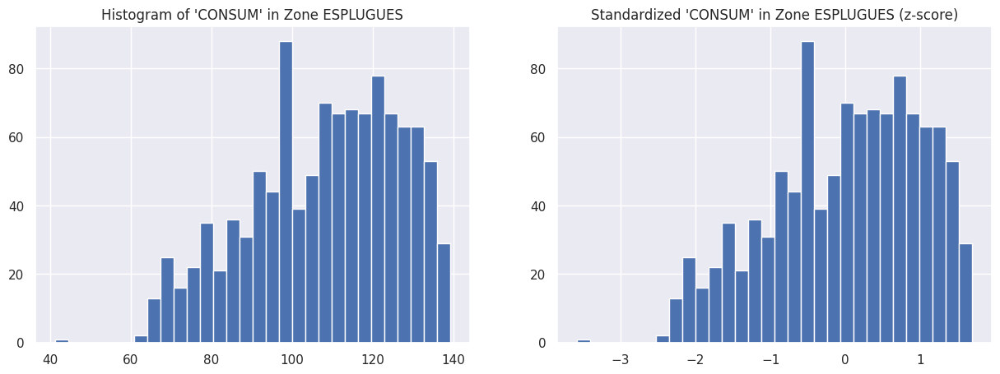

PALLEJA
Shapiro-Wilk test statistic: 0.9374
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


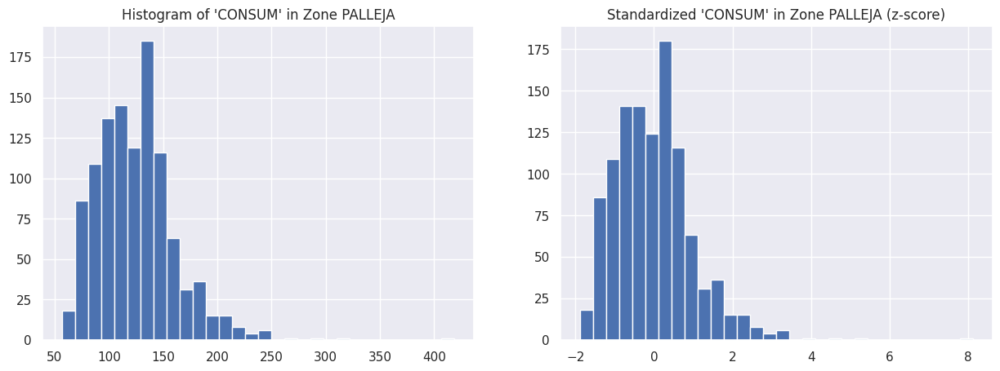

MONTGAT
Shapiro-Wilk test statistic: 0.9799
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


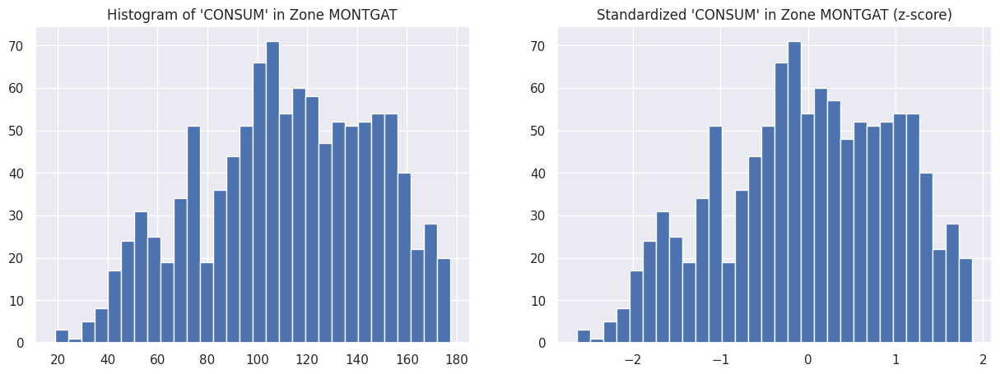

SANT JOAN DESPI
Shapiro-Wilk test statistic: 0.9873
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


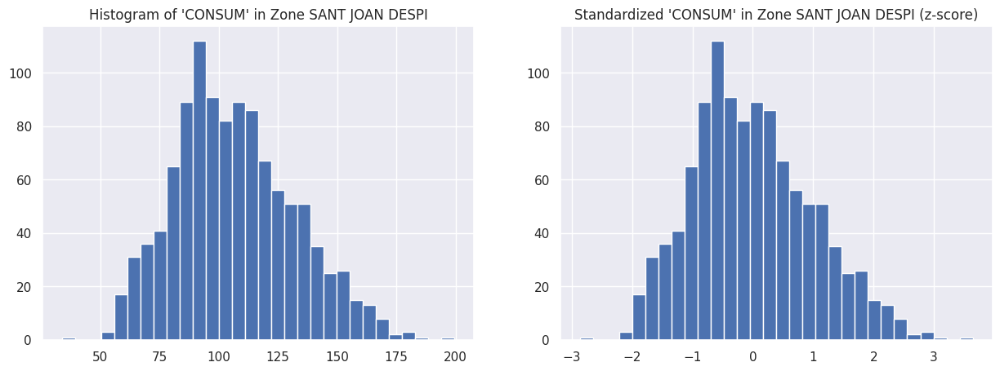

SANT CUGAT
Shapiro-Wilk test statistic: 0.9802
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


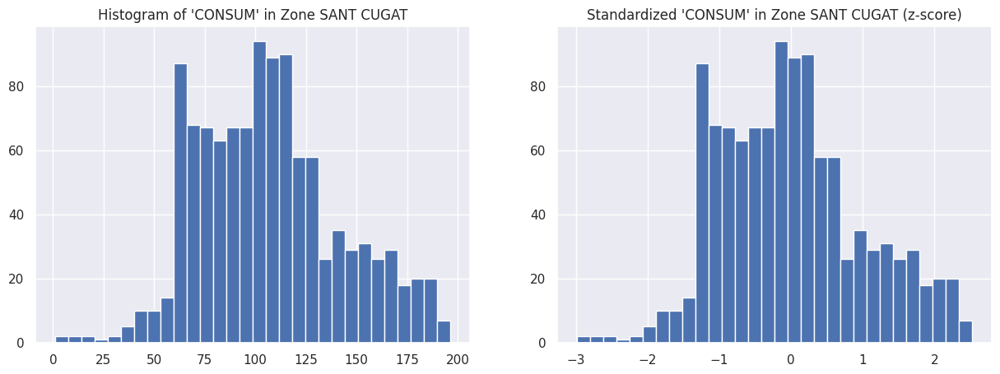

CASTELLDEFELS
Shapiro-Wilk test statistic: 0.9627
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


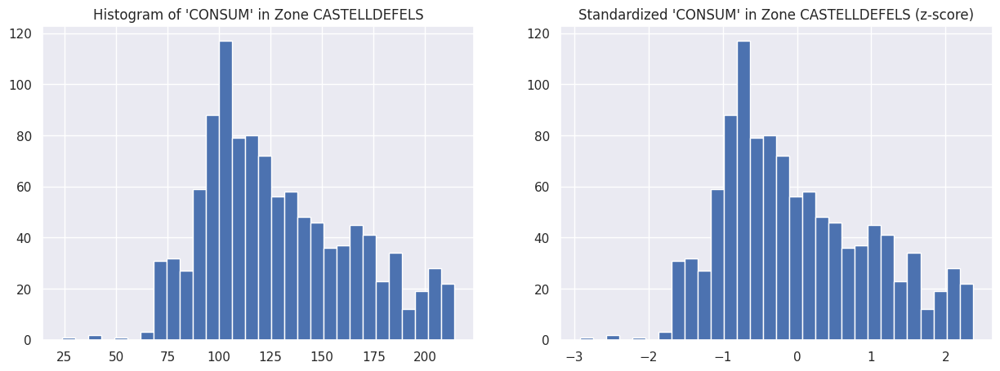

SANT ADRIA
Shapiro-Wilk test statistic: 0.9834
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


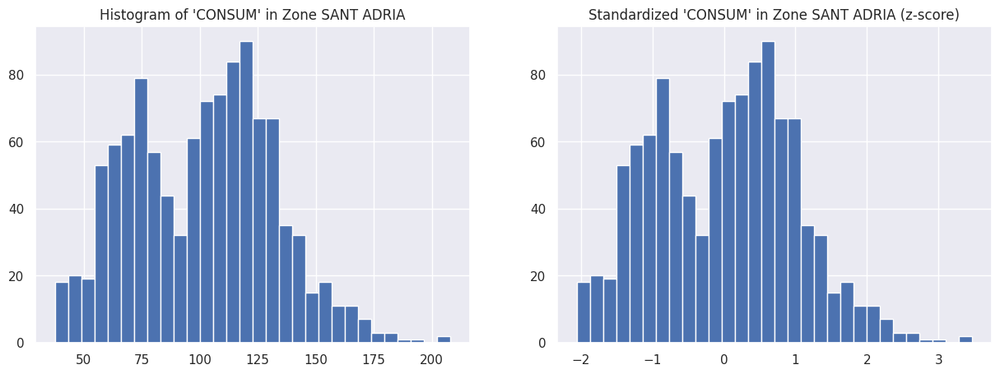

LA LLAGOSTA
Shapiro-Wilk test statistic: 0.9342
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


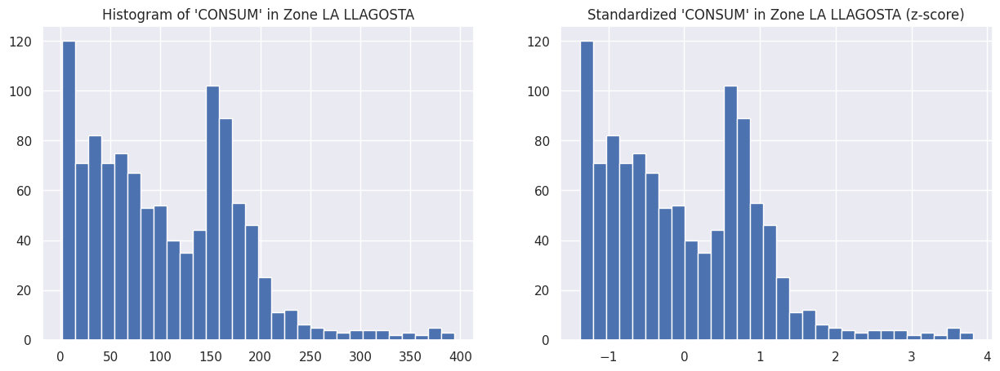

SANT CLIMENT LLOB.
Shapiro-Wilk test statistic: 0.7677
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


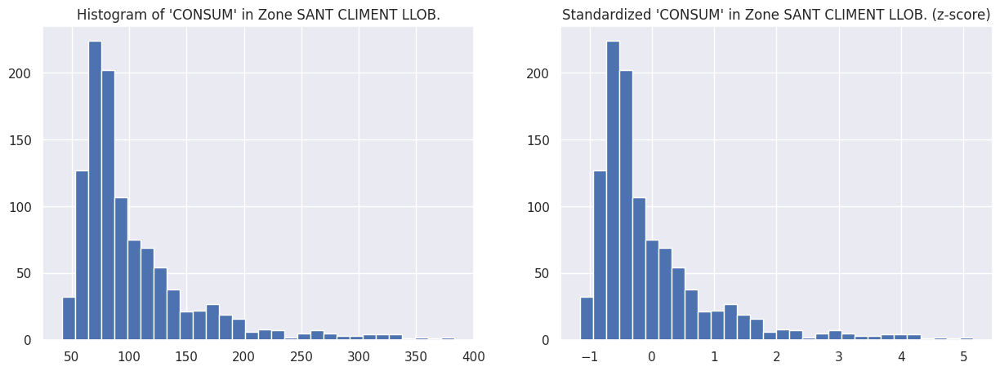

SANT FELIU LL.
Shapiro-Wilk test statistic: 0.7399
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


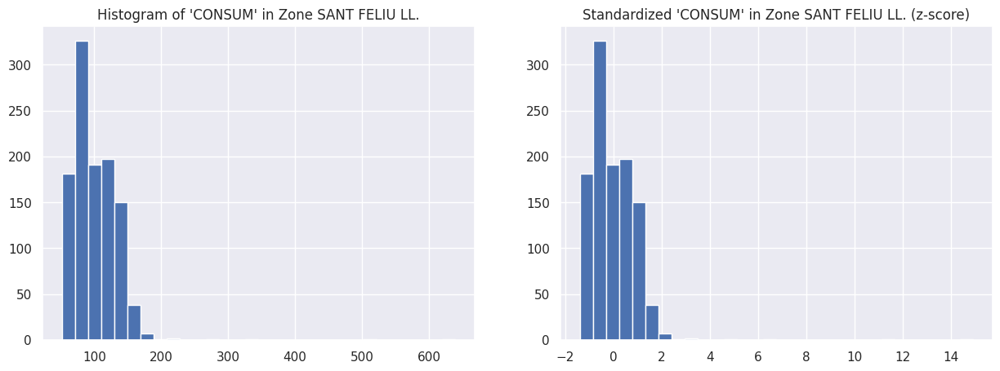

SANT JUST DESVERN
Shapiro-Wilk test statistic: 0.9727
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


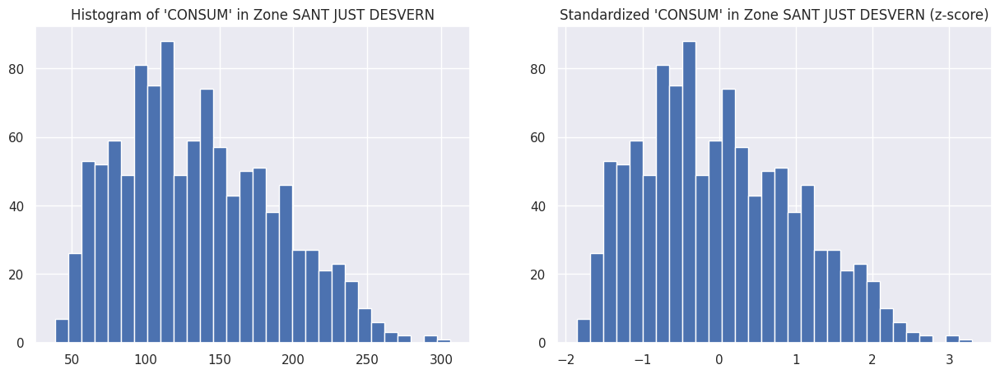

EL PAPIOL
Shapiro-Wilk test statistic: 0.9766
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


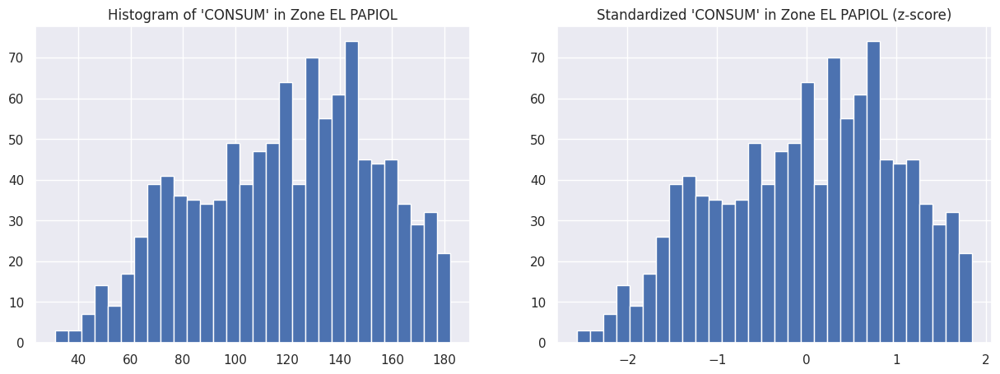

BARCELONA
Shapiro-Wilk test statistic: 0.8117
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


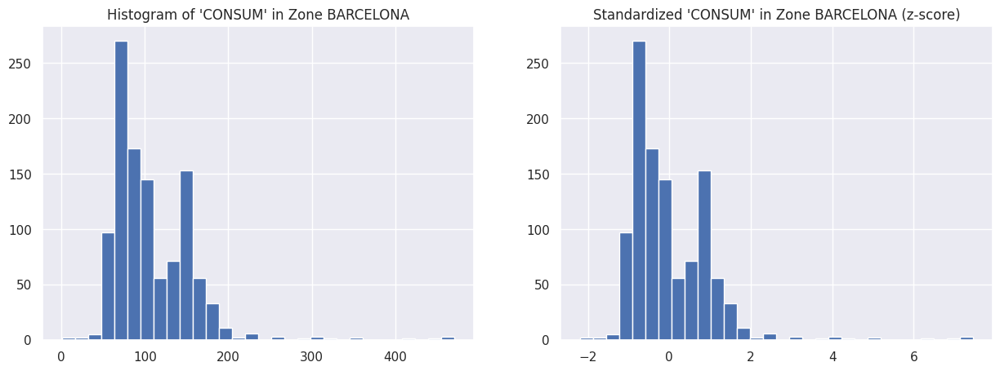

STA.COLOMA CERVELLO
Shapiro-Wilk test statistic: 0.7242
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


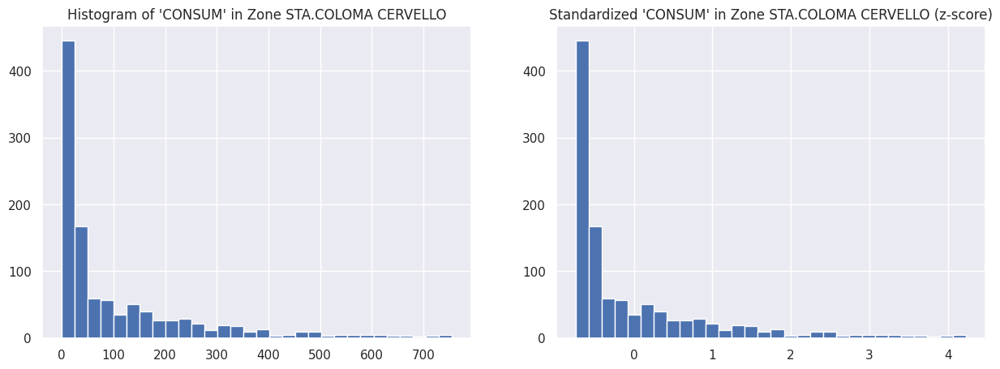

MONTCADA I REIXAC
Shapiro-Wilk test statistic: 0.9772
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


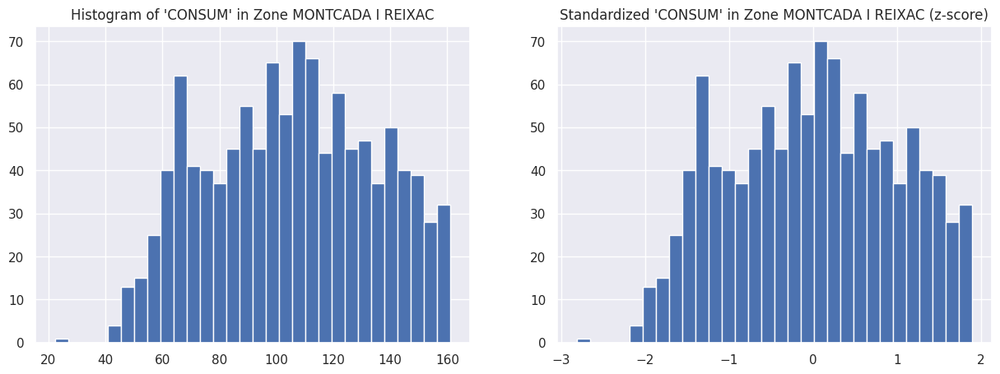

LES BOTIGUES SITGES
Shapiro-Wilk test statistic: 0.8583
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


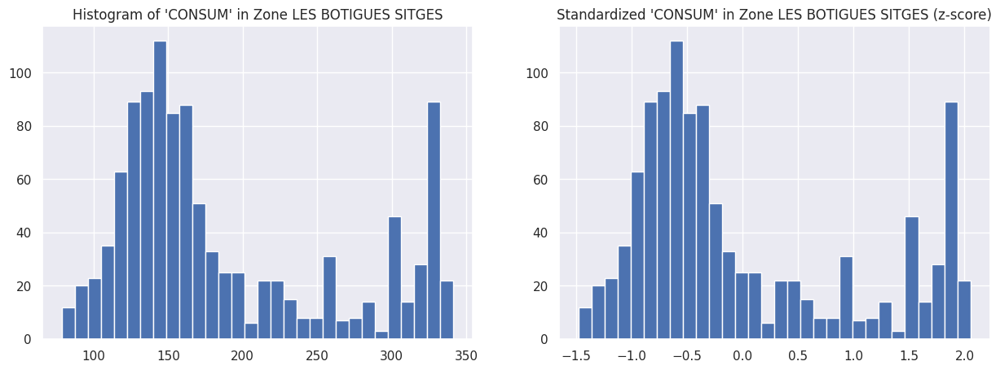

BADIA
Shapiro-Wilk test statistic: 0.8561
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


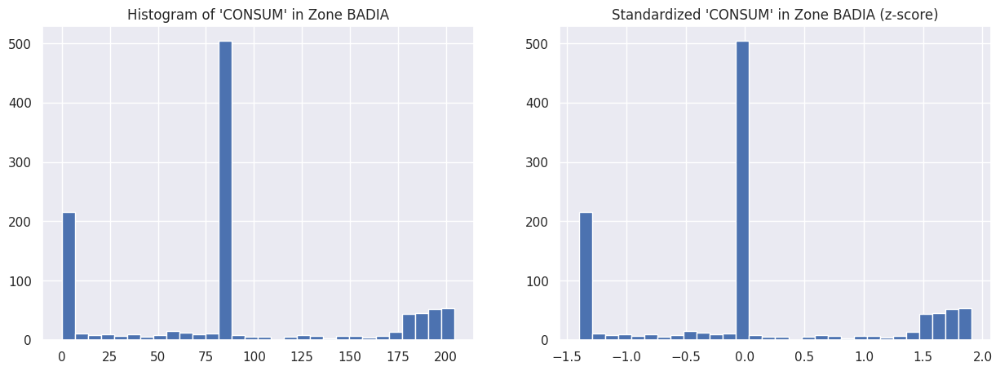

TIANA
Shapiro-Wilk test statistic: 0.8634
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


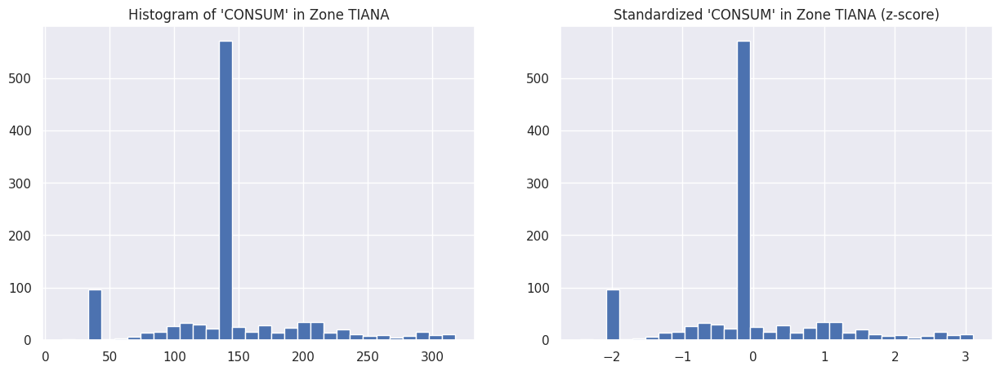

SABADELL
Shapiro-Wilk test statistic: 0.6106
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


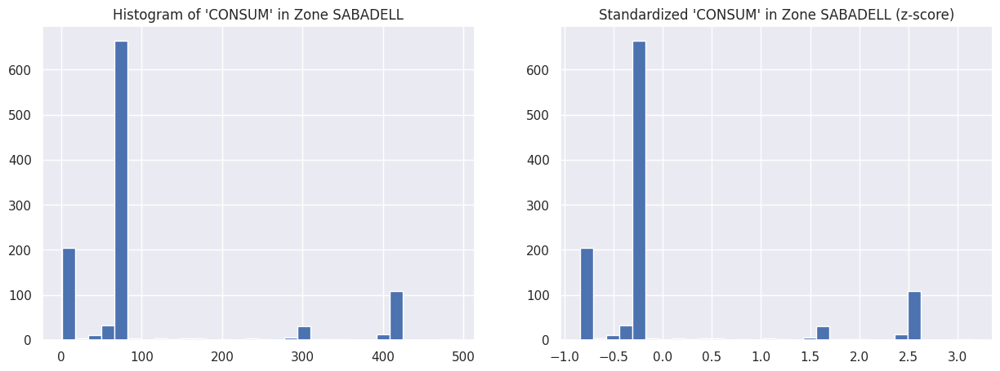

RIPOLLET
Shapiro-Wilk test statistic: 0.2434
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


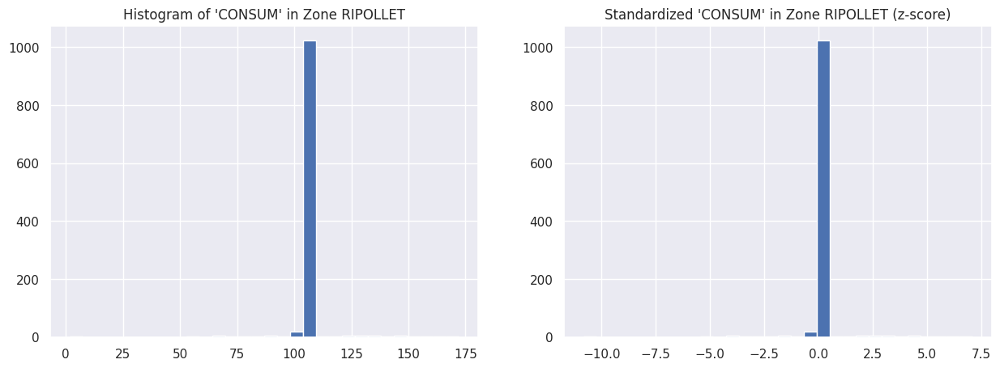

SANT BOI
Shapiro-Wilk test statistic: 0.9579
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


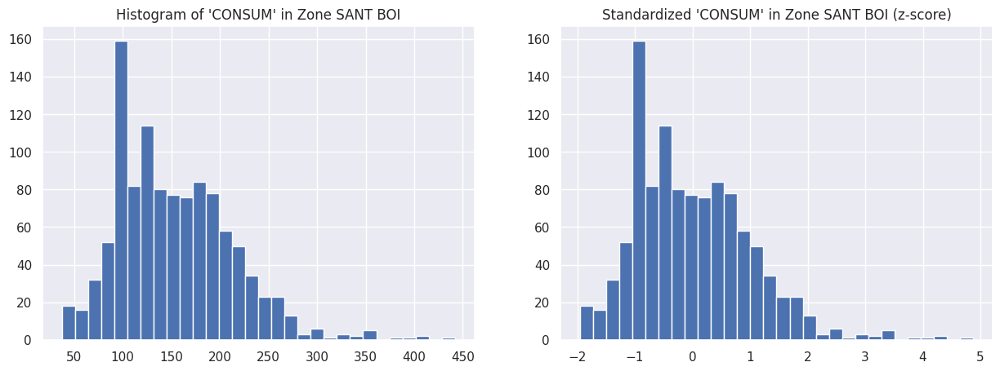

BADALONA
Shapiro-Wilk test statistic: 0.9342
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


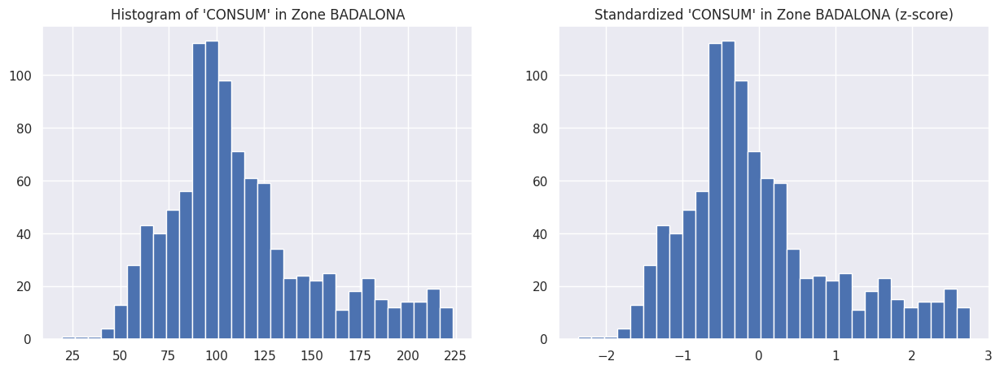

CORNELLA
Shapiro-Wilk test statistic: 0.9837
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


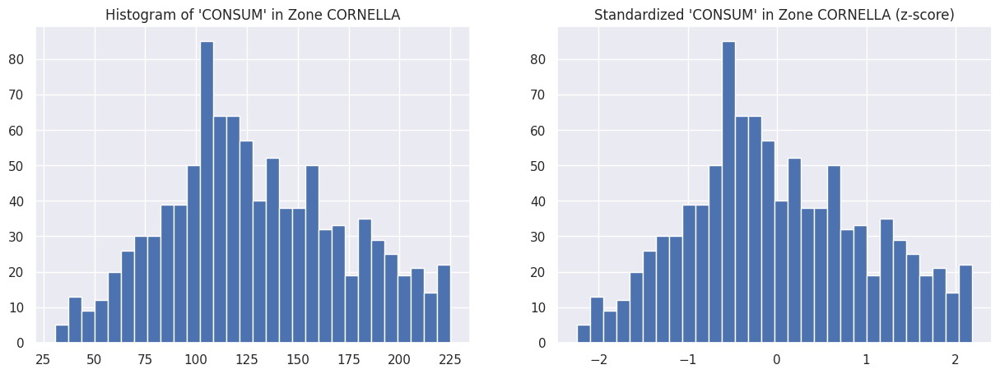

CERDANYOLA
Shapiro-Wilk test statistic: 0.9816
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


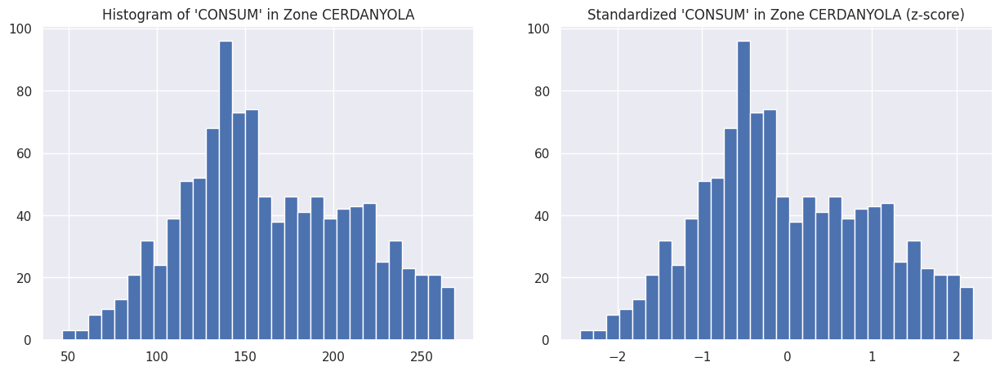

STA.COLOMA GRAMENET
Shapiro-Wilk test statistic: 0.9808
p-value: 0.0000
The 'CONSUM' series is likely not normally distributed.


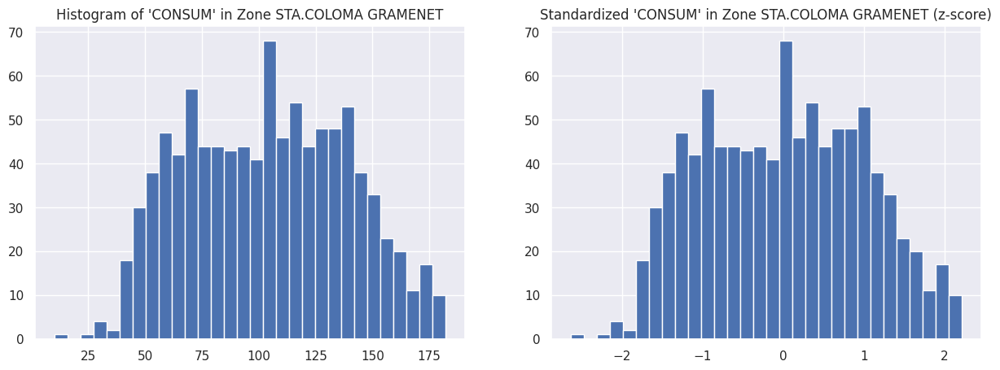

In [ ]:
for zone in all_zone_data['ZONA'].unique():
    zone_data = all_zone_data[all_zone_data['ZONA']== zone]
    print(zone)
    shapiro_wilk_test(zone_data)

    # create a histogram of the 'CONSUM' column in the zone_data DataFrame
    sns.set(rc={'figure.figsize':(15, 5)})
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.hist(zone_data['CONSUM'], bins=30)

    # plot normalized zone_data using z-score in ax2
    z_score = (zone_data['CONSUM'] - zone_data['CONSUM'].mean()) / zone_data['CONSUM'].std()
    ax2.hist(z_score, bins=30)

    ax1.set_title("Histogram of 'CONSUM' in Zone "+zone)
    ax2.set_title("Standardized 'CONSUM' in Zone "+zone+" (z-score)")

    # show the subplots
    plt.show()

## Export DataFrame


In [ ]:
for zone in all_zone_data['ZONA'].unique():
  print(zone.ljust(30) + str(len(all_zone_data[all_zone_data['ZONA']==zone])))

TORRELLES LLOBREGAT           1097
GAVA                          1097
VILADECANS                    1097
BEGUES                        1097
L'HOSPITALET LLOBR.           1097
ESPLUGUES                     1097
PALLEJA                       1097
MONTGAT                       1097
SANT JOAN DESPI               1097
SANT CUGAT                    1097
CASTELLDEFELS                 1097
SANT ADRIA                    1097
LA LLAGOSTA                   1097
SANT CLIMENT LLOB.            1097
SANT FELIU LL.                1097
SANT JUST DESVERN             1097
EL PAPIOL                     1097
BARCELONA                     1097
STA.COLOMA CERVELLO           1097
MONTCADA I REIXAC             1097
LES BOTIGUES SITGES           1097
BADIA                         1097
TIANA                         1097
SABADELL                      1097
RIPOLLET                      1097
SANT BOI                      1094
BADALONA                      1016
CORNELLA                      1010
CERDANYOLA          

In [ ]:
all_zone_data

,ZONA,CONSUM,Estimated,DAY,MONTH,YEAR,WEEKDAY_NUM,IS_WEEKEND
2019-01-01,TORRELLES LLOBREGAT,79.533113,0.0,1.0,1.0,2019.0,1.0,0.0
2019-01-02,TORRELLES LLOBREGAT,88.636301,0.0,2.0,1.0,2019.0,2.0,0.0
2019-01-03,TORRELLES LLOBREGAT,87.678071,0.0,3.0,1.0,2019.0,3.0,0.0
2019-01-04,TORRELLES LLOBREGAT,85.522052,0.0,4.0,1.0,2019.0,4.0,0.0
2019-01-05,TORRELLES LLOBREGAT,87.678071,0.0,5.0,1.0,2019.0,5.0,1.0
...,...,...,...,...,...,...,...,...
2021-12-28,STA.COLOMA GRAMENET,104.241199,1.0,28.0,12.0,2021.0,1.0,0.0
2021-12-29,STA.COLOMA GRAMENET,104.240885,1.0,29.0,12.0,2021.0,2.0,0.0
2021-12-30,STA.COLOMA GRAMENET,104.241042,1.0,30.0,12.0,2021.0,3.0,0.0
2021-12-31,STA.COLOMA GRAMENET,104.240963,1.0,31.0,12.0,2021.0,4.0,0.0


In [ ]:
all_zone_data.to_csv("/content/drive/MyDrive/TFG/Data AB/all_zone_data.csv")

## Plot years

In [ ]:
def plot_zone_years(zone):
    zone_data = all_zone_data[all_zone_data['ZONA']==zone]
    zone_data.index = pd.to_datetime(zone_data.index)

    # Resample the data to monthly frequency and group by year
    monthly_data = zone_data['CONSUM'].resample('M').mean().groupby(zone_data.index.year)

    colors = ['blue', 'orange', 'green']
    for i, (year, data) in enumerate(monthly_data):
        plt.plot(data.index.month, data.values, 'o-', label = year, color=colors[i])

    plt.xlabel("Month")
    plt.ylabel("Consumption")
    plt.title(f"Monthly Consumption for Zone {zone}")
    plt.legend()
    plt.show()

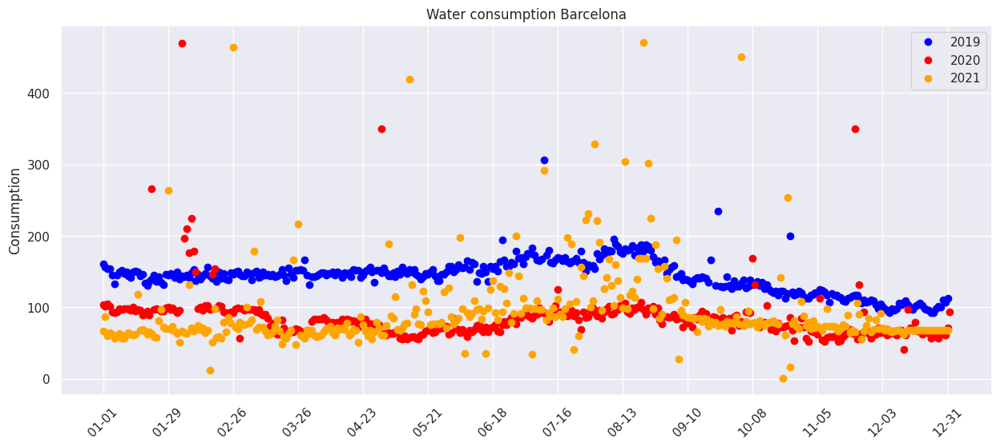

In [ ]:
zone_data = all_zone_data[all_zone_data['ZONA'] == 'BARCELONA']

zone_data.index = pd.to_datetime(zone_data.index)

data_2019 = zone_data[zone_data.index.year == 2019]['CONSUM']
data_2020 = zone_data[zone_data.index.year == 2020]['CONSUM']
data_2021 = zone_data[zone_data.index.year == 2021]['CONSUM']

fig, ax = plt.subplots(figsize=(15,6))
ax.plot(data_2019.index.strftime('%m-%d'), data_2019.values, 'o', color='blue', label='2019')

ax.plot(data_2020.index.strftime('%m-%d'), data_2020.values, 'o', color='red', label='2020')

ax.plot(data_2021.index.strftime('%m-%d'), data_2021.values, 'o', color='orange', label='2021')

ax.set_ylabel('Consumption')
ax.set_xticks(range(0, len(data_2019.index), 28))
date_labels = data_2019.index[::28].strftime('%m-%d').tolist()
ax.set_xticklabels(date_labels)
plt.xticks(rotation=45)
ax.set_title('Water consumption Barcelona')
plt.legend()
plt.show()



## Seasonal patterns

In [ ]:

zone_data = all_zone_data[all_zone_data['ZONA']=='BARCELONA']

zone_data.index = pd.to_datetime(zone_data.index)

data_2019 = zone_data[zone_data.index.year == 2019]['CONSUM']
data_2020 = zone_data[zone_data.index.year == 2020]['CONSUM']
data_2021 = zone_data[zone_data.index.year == 2021]['CONSUM']

# Calculate the increase ratio for 2019
summer_consum_2019 = zone_data[(zone_data.index.month >= 6) & (zone_data.index.month < 9) & (zone_data.index.year == 2019)]['CONSUM'].sum()
non_summer_consum_2019 = zone_data[(zone_data.index.month < 6) | (zone_data.index.month >= 9) & (zone_data.index.year == 2019)]['CONSUM'].sum()
increase_ratio_2019 = ((summer_consum_2019 - non_summer_consum_2019) / non_summer_consum_2019) * 100

# Calculate the increase ratio for 2020
summer_consum_2020 = zone_data[(zone_data.index.month >= 6) & (zone_data.index.month < 9) & (zone_data.index.year == 2020)]['CONSUM'].sum()
non_summer_consum_2020 = zone_data[(zone_data.index.month < 6) | (zone_data.index.month >= 9) & (zone_data.index.year == 2020)]['CONSUM'].sum()
increase_ratio_2020 = ((summer_consum_2020 - non_summer_consum_2020) / non_summer_consum_2020) * 100

# Calculate the increase ratio for 2021
summer_consum_2021 = zone_data[(zone_data.index.month >= 6) & (zone_data.index.month < 9) & (zone_data.index.year == 2021)]['CONSUM'].sum()
non_summer_consum_2021 = zone_data[(zone_data.index.month < 6) | (zone_data.index.month >= 9) & (zone_data.index.year == 2021)]['CONSUM'].sum()
increase_ratio_2021 = ((summer_consum_2021 - non_summer_consum_2021) / non_summer_consum_2021) * 100

print(f"Increase ratio in 2019: {increase_ratio_2019:.2f}%")
print(f"Increase ratio in 2020: {increase_ratio_2020:.2f}%")
print(f"Increase ratio in 2021: {increase_ratio_2021:.2f}%")


Increase ratio in 2019: -75.43%
Increase ratio in 2020: -86.21%
Increase ratio in 2021: -79.58%


## Polynomial regression curve fitting

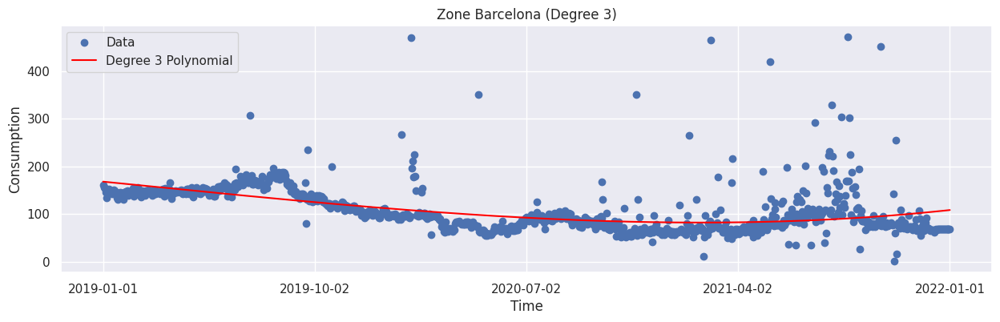

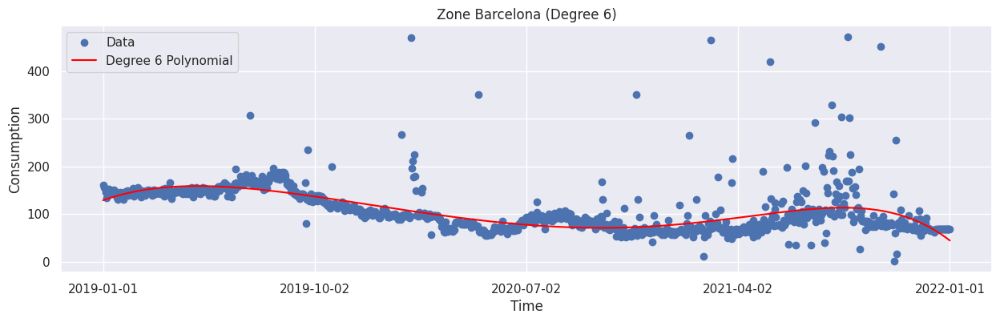

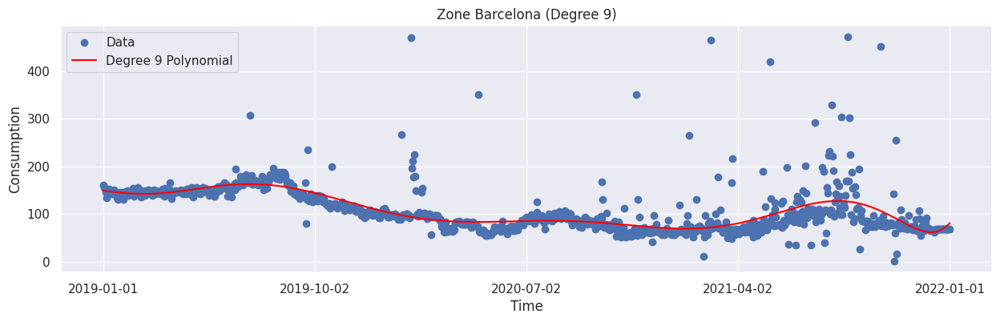

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Subset the data for Barcelona
zone_data = all_zone_data[all_zone_data['ZONA'] == 'BARCELONA']

# Convert datetime to numeric values
x = np.arange(len(zone_data))
y = zone_data['CONSUM'].values
dates = pd.to_datetime(zone_data.index).date

degrees = [3, 6, 9]

# Create three individual plots
for i, degree in enumerate(degrees):
    fig, ax = plt.subplots(figsize=(15, 4))

    # Fit the polynomial
    p = np.polyfit(x, y, deg=degree)
    f = np.poly1d(p)

    ax.plot(x, y, 'o', label='Data')
    ax.plot(x, f(x), '-', label=f'Degree {degree} Polynomial', color='red')

    ax.set_title(f"Zone Barcelona (Degree {degree})")
    ax.set_xlabel("Time")
    ax.set_ylabel("Consumption")

    num_ticks = 5
    tick_positions = np.linspace(0, len(x) - 1, num_ticks, dtype=int)
    tick_labels = dates[tick_positions]
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels)

    ax.legend()

    plt.show()




## Pandemic effects on consumption

In [ ]:
before_date = '2020-03-14'
after_date = '2020-06-21'

# Filter the data by the given dates
filtered_data = all_zone_data[(all_zone_data.index < before_date) | (all_zone_data.index > after_date)]

# Calculate the mean consumption for each zone before and after the given dates
before_means = filtered_data[filtered_data.index < before_date].groupby('ZONA')['CONSUM'].mean()
after_means = filtered_data[filtered_data.index > after_date].groupby('ZONA')['CONSUM'].mean()

# Create a new DataFrame to store the results
results_df = pd.DataFrame({'zone': before_means.index,
                           'mean_before': before_means.values,
                           'mean_after': after_means.values})

# Calculate the percentage increase in consumption
results_df['percent_increase'] = ((results_df['mean_after'] - results_df['mean_before']) / results_df['mean_before']) * 100

# Sort the DataFrame by percentage increase
results_df = results_df.sort_values(by='percent_increase', ascending=False)

# Format the percentage increase column as a percentage
results_df['percent_increase'] = results_df['percent_increase'].map('{:.2f}%'.format)

results_df

,zone,mean_before,mean_after,percent_increase
11,LA LLAGOSTA,49.718823,155.551655,212.86%
17,SABADELL,68.557929,137.698505,100.85%
14,MONTGAT,88.709768,129.404294,45.87%
18,SANT ADRIA,90.072796,116.648755,29.50%
15,PALLEJA,111.378307,141.042934,26.63%
10,L'HOSPITALET LLOBR.,87.142056,109.139918,25.24%
23,SANT JOAN DESPI,96.030878,113.220944,17.90%
1,BADIA,76.111593,88.195125,15.88%
9,GAVA,114.461952,131.199044,14.62%
7,EL PAPIOL,115.164732,127.027111,10.30%


In [ ]:
for zone in all_zone_data['ZONA'].unique():
  print(zone.ljust(30) + str(len(all_zone_data[all_zone_data['ZONA']==zone])))

TORRELLES LLOBREGAT           1097
GAVA                          1097
VILADECANS                    1097
BEGUES                        1097
L'HOSPITALET LLOBR.           1097
ESPLUGUES                     1097
PALLEJA                       1097
MONTGAT                       1097
SANT JOAN DESPI               1097
SANT CUGAT                    1097
CASTELLDEFELS                 1097
SANT ADRIA                    1097
LA LLAGOSTA                   1097
SANT CLIMENT LLOB.            1097
SANT FELIU LL.                1097
SANT JUST DESVERN             1097
EL PAPIOL                     1097
BARCELONA                     1097
STA.COLOMA CERVELLO           1097
MONTCADA I REIXAC             1097
LES BOTIGUES SITGES           1097
BADIA                         1097
TIANA                         1097
SABADELL                      1097
RIPOLLET                      1097
SANT BOI                      1094
BADALONA                      1016
CORNELLA                      1010
CERDANYOLA          